# __The Mathematics of Imaging__
> __Presenter__: Matthew Blackledge \
> Division of Radiotherapy and Imaging \
> Institute of Cancer Research

A quick introduction to the core mathematical ideas behind image acquisition and image processing.  These notes form the core materials for the course "Image theory, processing and perception" run by the joint department of Radiotherapty and Imaging at the Institute of Cancer Research and Royal Marsden Hostpial in London, UK

- These slides are __interactive!__ You can use an IPython/Jupyter notebook to try this for yourself. (If you don't know Python then don't worry, it is used here to demonstrate the core principles)

- We cannot cover everything.  Imaging is a large field and still a very active area of research.

___Slide availability___: These slides are available on my GitHub page: https://github.com/mdblackledge/theoryofimaging

You can open this Notebook within Google Colab using the following link.  This will assume that you have a Google account!
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/mdblackledge/theoryofimaging/blob/main/notes.ipynb)

___Acknowledgements___: The content of this course is _hugely_ inspired by the fantastic work of Mike Patridge who delivered this course prior to 2018

___Copyright___: Matthew Blackledge 2026

# __Contents__


__Lecture 1__: Mathematical Fundamentals of Image Processing<br>
_Image formation_<br>
 > 1.1 Representation of Images<br>
 > 1.2 Convolution<br>
 > 1.3 Fourier Transforms<br>

_Describing Imaging Systems_<br>
 > 1.4 Linear Systems<br>
 > 1.5 Point Spread Function<br>
 > 1.6 Transfer Functions<br>

_Sampling Theory_<br>
 > 1.7 The Comb and Rectangle Functions<br>
 > 1.8 Finite Apertures and Sampling Rates<br>
 > 1.9 Aliasing<br>

__Lecture 2__: Enhancing Images<br>
_Image Enhancement and Filtering_<br>
 > 2.1 Motivation Behind Image Enhancement <br>
 > 2.2 Point Operators<br>
 > 2.3 Spatial Operators<br>
 > 2.4 Transform Operators<br>

_Noise_<br>
 > 2.5 Noise Distributions<br>
 > 2.6 Noise Filtering<br>
 > 2.7 Practical Considerations of Noise<br>

 __Lecture 3__: Fundamentals of Generative AI<br>
 _Brief Introduction to Probability Theory_<br>
 > 3.1 Probability Distributions <br>
 > 3.2 Notation <br>
 > 3.3 Core Concepts <br>

 _Probabilistic Interpretation of Generative AI_<br>
 > 3.4 Probabilistic Interpretation of Classifiers and Regression <br>
 > 3.5 Probability Calibration of Classifiers and Regression <br>
 > 3.6 How Generative AI Differs <br>

 _Core Technologies of Generative AI_<br>
 > 3.7 Principal Components Analysis (PCA) <br>
 > 3.8 Variational Autoencoders (VAEs) <br>
 > 3.9 Generative Adversarial Networks (GANs) <br>
 > 3.10 Transformers for Generative Modelling <br>
 > 3.11 Denoising Diffusion Probabilistic Modeling (DDPM) <br>

 _Examples in Medical Imaging_<br>


# _0.1 Useful Resources_

Some useful books upon which these notes are based.


<img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/GonzalezBook.jpg?raw=true" width=200/>

__Digital Image Processing__,<br>_R. C. Gonzales and R. E. Woods, Pearson_.<br>
Good for learning about classical image processing ideas such as morphological operations, image smoothing, edge detection and so on.

---

<img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/WebbBook.jpg?raw=true" width=200/>

__Webb's Physics of Medical Imaging__,<br>_M. A. Flower (Ed.), CRC Press._<br> Good for understanding of the core concepts of medical image acquisition, covering a range of modalities including MRI, CT, ultrasound and nuclear medicine.

---

<img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/YooBook.jpg?raw=true" width=200/>

__Insight Into Images__, _T. S. Yoo (Ed.), ITK_ <br>
Covers one of the most import software libraries for contemporary image processing (image segmentation and registration)

---

<img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/BlackledgeBook.jpg?raw=true" width=200/>

__Digital Image Processing__, _J. M. Blackledge, Woodhead Publishing_ <br>
A rigourous mathematical explanation behind some of the techniques that are covered in this course.

---

<img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/BookLangtangen.jpg?raw=true" width=200/>

__A Primer on Scientitifc Programming with Python__, _H. P. Langtangen, Springer_ <br>
Helpful for those not familiar with some of the concepts of Python programming with a focaus on scientific application.

# _0.2 Import relevant libraries_

Before we start, we need to install some python libraries to run the code.<br> Run the cell bellow to do this.

In [1]:
#@title
import os
import wave as wave_os

# Essential plotting and scientific libraries
import matplotlib.pyplot as pl
from matplotlib.colors import LinearSegmentedColormap
%matplotlib inline
import numpy as np

# Fast Fourier transform
from numpy import fft

# Image i/o and resize functionality
from skimage.io import imread
from skimage.transform import resize

# IPython display imports for user interface elements.
import IPython
from ipywidgets import interact, FloatSlider, IntSlider, RadioButtons, Button, HBox, VBox, Checkbox
from IPython.display import Image, display, clear_output

# An example image we can use
import imageio.v3 as iio
url = "https://raw.githubusercontent.com/mdblackledge/theoryofimaging/774f48874723ce6e6cc9f779e12c1ebcc5b3598d/Lecture_1/images/face.jpg"
face = iio.imread(url)

# 2D convolution
from scipy.signal import convolve2d

# Some useful sound files for later
if not os.path.exists("c_acoustic_loud.wav"):
    os.system("wget -O c_acoustic_loud.wav https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/c_acoustic_loud.wav?raw=true")
if not os.path.exists("c_classical_loud.wav"):
    os.system("wget -O c_classical_loud.wav https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/c_classical_loud.wav?raw=true")

#__Lecture 1__

# __1.1 Representation of Images__

## Pixel Space


- Thanks to technologies like the charge-couple device (CCD), images are now represented digitally through 'pixels'

 - The position of each pixel is represented in 2-dimensinal space by the indices $(j, i)$, which can be converted to real-space coordinates through knowledge of the __origin__ $(O_{x}, O_{y})$ and __resolution__ $(r_{x}, r_{y})$:<br><br>
 <center>
    <img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/pixels_.jpg?raw=true", width = 60%>
 </center>

  - In general we also need to think about the __orientation__, $\theta$, of the image with respect to real-space coordinates (however we chose them).<br><br>
 <center>
    <img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/pixels_full.jpg?raw=true", width = 60%>
 </center>

## Pixel Values

Image information is stored by assigning a numeric value to each pixel:

In [2]:
#@title
# Extract the red colour channel from the image
R_channel = face[::-1, :, 0]

zoom_slider = FloatSlider(min=1.00, max=70.0, step=1, value=1.0, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(zoom=zoom_slider)
def plot(zoom):
    fig = pl.figure(figsize = (13, 9))
    ax = fig.add_subplot(111)
    ax.imshow(R_channel, cmap = 'gray', interpolation = 'None', origin = 'upper')

    # Set the viewport to display a zoomed in version of the image
    zoom_factor = 1.0/zoom
    xRange = [int(face.shape[1] / 2 * (1 - zoom_factor)), int(face.shape[1] / 2 * (1 + zoom_factor))]
    yRange = [int(face.shape[0] / 2 * (1 - zoom_factor)), int(face.shape[0] / 2 * (1 + zoom_factor))]
    ax.set_xlim(*xRange)
    ax.set_ylim(*yRange)
    ax.set_xlabel('i'), ax.set_ylabel('j')

    # If the zoom factor is high enough then display the pixel values
    if zoom >= 50:
        for i in range(xRange[0]+1, xRange[1]):
            for j in range(yRange[0]+1, yRange[1]):
                if R_channel[j, i] < 100:
                    color = 'w'
                else:
                    color = 'k'
                ax.text(i, j, "%d"%R_channel[j, i],
                        verticalalignment = 'center', horizontalalignment = 'center',
                        color = color, fontsize = 13)

    pl.show()

interactive(children=(FloatSlider(value=1.0, continuous_update=False, description='zoom', max=70.0, min=1.0, s…

## Colour spaces

The pixel value might also represent the amount of 'red', 'green' and 'blue' in the image (so called RGB colour space)

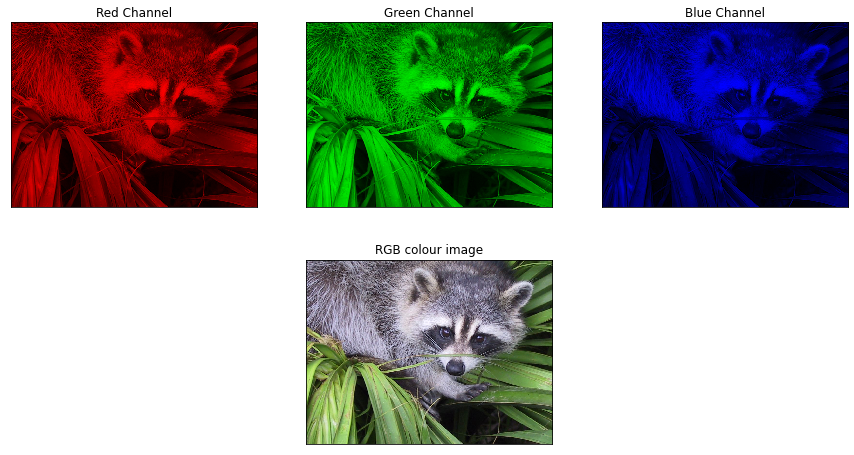

In [ ]:
#@title
# Extract the red colour channel from the image
R_channel = face[:, :, 0]
G_channel = face[:, :, 1]
B_channel = face[:, :, 2]

# Cretate a red colormap
colors = [(0, 0, 0), (1, 0, 0)] # Black -> Red
cm_red = LinearSegmentedColormap.from_list("blackred", colors, N=256)

# Cretate a green colormap
colors = [(0, 0, 0), (0, 1, 0)] # Black -> Green
cm_green = LinearSegmentedColormap.from_list("blackgreen", colors, N=256)

# Cretate a blue colormap
colors = [(0, 0, 0), (0, 0, 1)] # Black -> Blue
cm_blue = LinearSegmentedColormap.from_list("blackblue", colors, N=256)

f = pl.figure(figsize = (15, 8))
ax1 = f.add_subplot(231)
ax1.imshow(R_channel, cmap = cm_red, interpolation = 'None')
ax1.set_xticks([]), ax1.set_yticks([])
ax1.set_title('Red Channel')

ax2 = f.add_subplot(232)
ax2.imshow(G_channel, cmap = cm_green, interpolation = 'None')
ax2.set_xticks([]), ax2.set_yticks([])
ax2.set_title('Green Channel')

ax3 = f.add_subplot(233)
ax3.imshow(B_channel, cmap = cm_blue, interpolation = 'None')
ax3.set_xticks([]), ax3.set_yticks([])
ax3.set_title('Blue Channel')

ax4 = f.add_subplot(235)
ax4.imshow(face, interpolation = 'None')
ax4.set_xticks([]), ax4.set_yticks([])
ax4.set_title('RGB colour image')

pl.show()

There are other colour spaces that are of worthy note:

__CMYK__
<center>
<img src = "https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/cmyk.png?raw=true" width=200><br>
</center>
Cyan, magenta, yellow and black are the colours used in some printing systems.

<!-- #### __RGB__
<center>
<img src = "https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/rgba.jpg?raw=true" width=200><br>
</center>
Most commonly used for displaying digital images using digital devices (e.g. computer monitors). -->

__HSV__
<center>
<img src = "https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/hsv.png?raw=true" width=200><br>
</center>
Designed to make colour mixing more interpretable by humans.

## The Alpha Channel

Sometimes it might be useful to define the 'transparency' of the image when overlaying on top of another. Transparency is quantified by $\alpha$:<br><br>
$$
I_{final} = (1-\alpha) \cdot I_{1} + \alpha \cdot I_{2}
$$

In [3]:
#@title
# Invert the image in the y-direction
face_inverse = face[::-1, :]

alpha_slider = FloatSlider(min=0.0, max=1.0, step=0.01, value=0.0, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(alpha=alpha_slider)
def plot(alpha):

    fig = pl.figure(figsize = (9, 7))
    ax = fig.add_subplot(111)

    # Add the alpha channel.
    rgb_image = (1-alpha)*face + alpha*face_inverse

    # The image must be byte
    ax.imshow(rgb_image.astype('uint8'), origin = 'upper')
    pl.axis('off')
    pl.show()


interactive(children=(FloatSlider(value=0.0, continuous_update=False, description='alpha', max=1.0, step=0.01)…

It is also possible to change the alpha level for each pixel.  This results in RGBA colour spaces: <br><br>
<center>
    <img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/rgba.jpg?raw=true" width=300>
</center>

Alpha-cahnnels can be used to overlay images on top of one another:

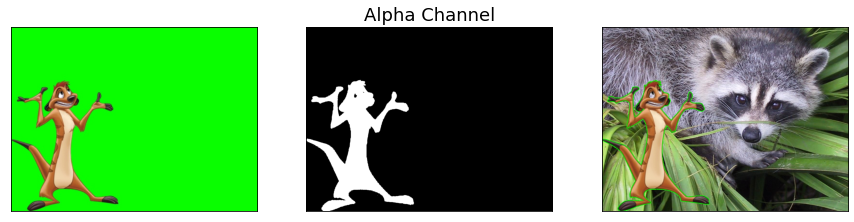

In [ ]:
#@title
try:
    greenscreen = imread("greenscreen.jpg")
except:
    # Need to download
    !wget -O greenscreen.jpg https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/greenscreen.jpg?raw=true
    greenscreen = imread("greenscreen.jpg")

# Add an alpha channel to the greenscreen - set to 255 to represent complete opacity
greenscreen = np.insert(greenscreen, 3, 255, axis = 2).astype('uint8')

f, (ax1, ax2, ax3) = pl.subplots(1, 3, figsize = (15, 11))

ax1.imshow(greenscreen)
ax1.set_xticks([]), ax1.set_yticks([])

# Now set greenscreen areas alpha to 0
alpha = 255 * (greenscreen[:, :, 1] < 245)
greenscreen[:, :, -1] = alpha.astype('uint8')

ax2.imshow(greenscreen[:, :, 3], cmap = 'gray')
ax2.set_title('Alpha Channel', fontsize = 18.0)
ax2.set_xticks([]), ax2.set_yticks([])

ax3.imshow(face)
ax3.imshow(greenscreen)
ax3.set_xticks([]), ax3.set_yticks([])

pl.show()

# __1.2 Convolution__

## Convolution Theory

 - Consider a point light source emitted through a 'pinhole camera' with finite aperture, and then projected onto a screen behind<br>
 - The resultant image, $h(x, y)$, is the __impulse response function__ of this camera.
<center>
    <img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/pinhole_projection.jpg?raw=true" width=500>
</center>

 - What would happen if there were multiple point sources?<br>
 - Rather than a true representation of the point sources, we have multiple circular regions that appear to overlap with one another - the image is a 'smeared' representation of the source.<br>
 - Moreover, if each point source has a different 'brightness', distributed as $f(x, y)$, then final image will be a weighted sumation of the impulse responses.<br>

<center>
    <img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/pinhole_projection_multiple.jpg?raw=true" width=500>
</center>

 - In general we have
   $$
     g(x, y) = \sum\limits_{m = 1}^{M}\sum\limits_{n = 1}^{N} f(x_{m}, y_{n})\cdot h(x - x_{m}, y - y_{n})
   $$<br>
 - Or in the continuous limit $N \rightarrow \infty$ and $M \rightarrow \infty$:
  $$
      g(x, y) = \iint\limits_{-\infty}^{\infty}h(x - \phi, y - \theta)f(\phi, \theta)\text{d}\phi\text{d}\theta
  $$
<br>

 - This is a process is described by the __convolution__ of one function, $a$, with another, $b$:
$$
  a(x) \circledast b(x) = \int\limits_{-\infty}^{\infty}a(x-\phi)b(\phi)\text{d}\phi = \int\limits_{-\infty}^{\infty}b(x-\phi)a(\phi)\text{d}\phi
$$

In [ ]:
#@title
convolution_slider = FloatSlider(min=0.0, max=0.8, step=0.01, value=0.0, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(x=convolution_slider)
def convolve_demo(x):

    theta = np.linspace(0, 1, 1000)

    a = 1.0 * (theta < 0.2)
    b = 10 * theta - 4
    b[int(theta.size/2)::] = b[int(theta.size/2):0:-1]
    b[b<0] = 0

    fig = pl.figure(figsize = (12, 5))
    ax1 = fig.add_subplot(121)
    ax1.plot(theta, np.roll(a, int(x*1000)), 'r-', label =  r'a($\phi$)')
    ax1.plot(theta, b, 'b-', label = r'b($\phi$)')
    ax1.set_xlabel(r'$\phi$', fontsize = 20.0)
    pl.legend(loc = 1, fontsize = 20.0)

    c = np.zeros(len(theta))
    for i in range(int(x*1000)):
        c[i+100] = np.sum(np.roll(a, i) * b)

    ax2 = fig.add_subplot(122)
    ax2.plot(theta, c, 'g-', label = 'c(x)')
    ax2.plot([x + 0.1], c[int(x*1000) + 99], 'go', ms = 15.0, label = 'Current c(x)')
    pl.legend(loc = 1, fontsize = 20.0)
    ax2.set_xlabel('x', fontsize = 20.0)
    ax2.set_ylim((0, 110))
    pl.show()


interactive(children=(FloatSlider(value=0.0, continuous_update=False, description='x', max=0.8, step=0.01), Ou…

 - Convolution can be applied in two or more dimensions:
\begin{align}
a(x, y)\circledast b(x, y) &= \iint\limits_{-\infty}^{\infty} a(x-\phi, y-\theta)b(\phi, \theta)\text{d}\phi\text{d}\theta \quad \text{(Continuous)}\\
a[i, j]\otimes b[i, j] &= \sum\limits_{m=1}^{M}\sum\limits_{n=1}^{N}a[i-m, j-n]\cdot b[m, n] \quad \text{(Discrete)}
\end{align}<br>
 - For example, convolving a disk with our example image tends to 'smooth-out' the final result.

In [ ]:
#@title
# Convert the red-channel of the 'face' to a floating point array (value 0 to 1):
face_R = face[:, :, 0].astype('float32')/255

disk_radius_slider = FloatSlider(min=1, max=20, step=1, value=1.0, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(disk_radius=disk_radius_slider)
def convolute_disk(disk_radius):

    face_ds = face_R[0::3, 0::3]

    # convolve with a disk of varying radius
    x = np.linspace(-1, 1, 40)
    X, Y = np.meshgrid(x, x)

    disk = 1.0*(X**2 + Y**2 < (disk_radius / 20)**2)

    f = pl.figure(figsize = (12, 7))
    ax1 = f.add_subplot(131)
    ax1.imshow(disk, cmap = 'gray', clim = (0, 1), interpolation = 'None')
    ax1.set_title('a(x)', fontsize = 15.0)

    ax2 = f.add_subplot(132)
    ax2.imshow(face_ds, cmap = 'gray', interpolation = 'None')
    ax2.set_title('b(x)', fontsize = 15.0)

    ax3 = f.add_subplot(133)
    ax3.imshow(convolve2d(face_ds, disk), cmap = 'gray', interpolation = 'None')
    ax3.set_title('c(x)', fontsize = 15.0)

    pl.tight_layout()
    pl.show()


interactive(children=(FloatSlider(value=1.0, continuous_update=False, description='disk_radius', max=20.0, min…


 - Note that the functions can be anything we like:

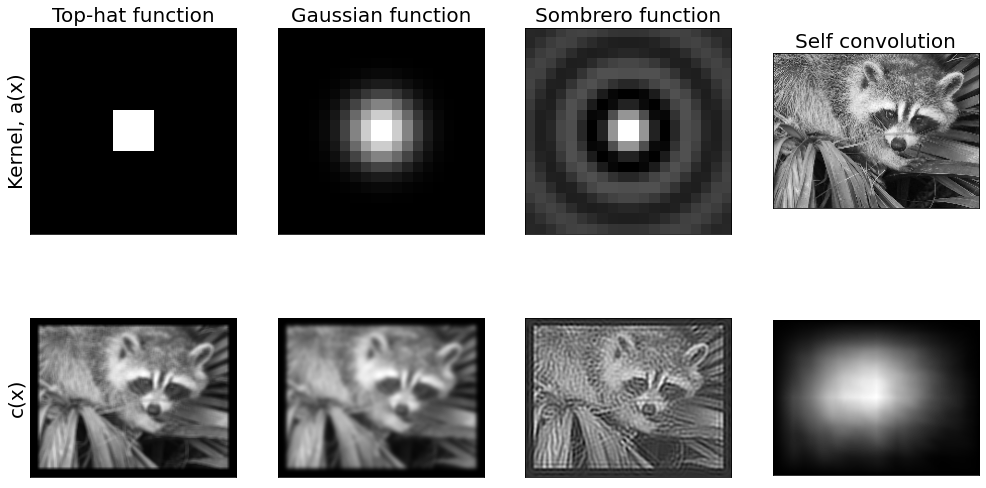

In [ ]:
#@title
def demo_convolutions():

    x = np.linspace(-1, 1, 20)
    X, Y = np.meshgrid(x, x)

    f = pl.figure(figsize = (17, 9))

    face_ds = face_R[0::5, 0::5]

    # top-hat function
    kernel = 1 * np.logical_and(np.abs(X) < 0.2, np.abs(Y) < 0.2)
    ax = f.add_subplot(241)
    ax.set_ylabel('Kernel, a(x)', fontsize = 20)
    ax.set_title('Top-hat function', fontsize = 20)
    ax.imshow(kernel, cmap = 'gray')
    ax.set_xticks([]), ax.set_yticks([])

    ax = f.add_subplot(245)
    ax.imshow(convolve2d(face_ds, kernel), cmap = 'gray')
    ax.set_xticks([]), ax.set_yticks([])
    ax.set_ylabel('c(x)', fontsize = 20)

    # Gaussian function
    variance = 0.05
    kernel = 1.0 / (2 * np.pi * variance) * np.exp(-0.5 * (X**2 + Y**2) / variance)
    ax = f.add_subplot(242)
    ax.imshow(kernel, cmap = 'gray')
    ax.set_xticks([]), ax.set_yticks([])
    ax.set_title('Gaussian function', fontsize = 20)

    ax = f.add_subplot(246)
    ax.imshow(convolve2d(face_ds, kernel), cmap = 'gray')
    ax.set_xticks([]), ax.set_yticks([])

    # Sinc/sombrero function
    r = np.sqrt(X**2 + Y**2)
    kernel = np.sinc(4*r)
    ax = f.add_subplot(243)
    ax.imshow(kernel, cmap = 'gray')
    ax.set_xticks([]), ax.set_yticks([])
    ax.set_title('Sombrero function', fontsize = 20)

    ax = f.add_subplot(247)
    ax.imshow(convolve2d(face_ds, kernel), cmap = 'gray')
    ax.set_xticks([]), ax.set_yticks([])


    # self-convolution
    kernel = face_ds
    ax = f.add_subplot(244)
    ax.imshow(kernel, cmap = 'gray')
    ax.set_xticks([]), ax.set_yticks([])
    ax.set_title('Self convolution', fontsize = 20)

    ax = f.add_subplot(248)
    ax.imshow(convolve2d(face_ds, kernel), cmap = 'gray')
    ax.set_xticks([]), ax.set_yticks([])

    pl.show()

demo_convolutions()


# __1.3 Fourier Transforms__

## Motivation

 - Diverting from images for the moment, let's think about what makes up different sounds.
 - Sound is propagated through a meterial such as air through a series of __compression waves__. The air is made to compress and refract, and this transfers energy from the object causing the waves to your ear so that you hear a sound.
 - The __frequency__, $\nu$, of the sound wave is what causes you to hear a different __pitch__.
 - The __amplitude__ of the sound wave changes the __intensity__ (or volume) of the sound.

<img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_1/images/wave_example.jpg?raw=true" width=600/>


## Examples of sounds waves

### Single frequency

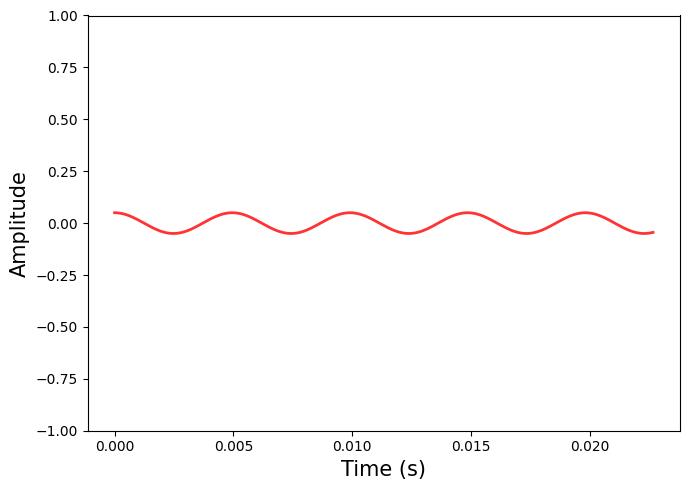

In [6]:
#@title
frequency = 202    # in Hz
amplitude = 0.05
duration = 3
frame_rate = 44100

time = np.linspace(0, duration, frame_rate * duration)
wave = amplitude * np.cos(time * 2 * np.pi * frequency)

# IPython seems to normalise the signal and amplitude is no-op
# Adding a ref channel to force this effect.
wave_ref = np.cos(time * 2 * np.pi * 20000)

# Display the results
fig = pl.figure(figsize = (7, 5))
ax = fig.add_subplot(111)
ax.plot(time[0:1000], wave[0:1000], color='r', lw=2, alpha=0.8)
ax.set_xlabel('Time (s)', fontsize = 15.0)
ax.set_ylabel('Amplitude',  fontsize = 15.0), ax.set_ylim((-1, 1))
pl.tight_layout()
pl.show()

IPython.display.Audio(wave, rate=frame_rate)

### Two frequencies

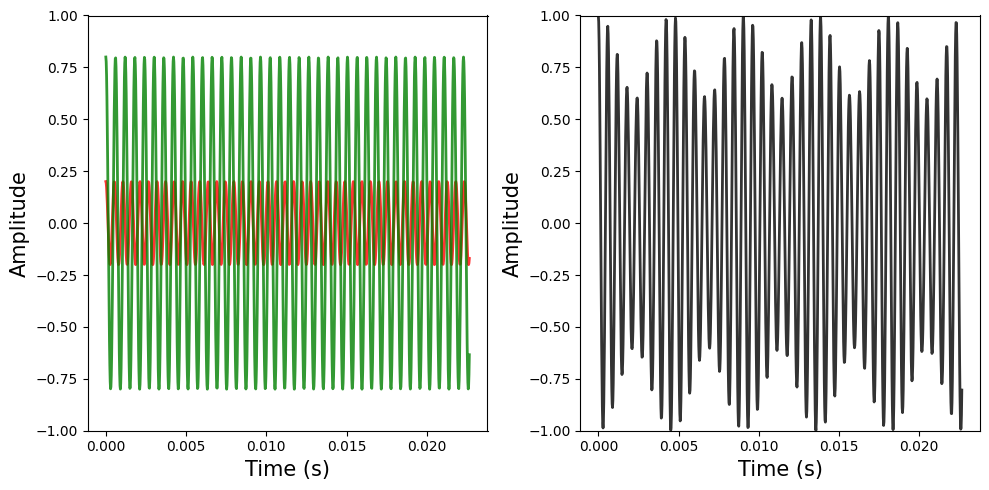

In [9]:
#@title
frequency_1 = 1880    # in Hz
frequency_2 = 1660    # in Hz
amplitude_1 = 0.2
amplitude_2 = 1.0 - amplitude_1
duration = 3
frame_rate = 44100

time = np.linspace(0, duration, frame_rate * duration)
wave_1 = amplitude_1 * np.cos(time * 2 * np.pi * frequency_1)
wave_2 = amplitude_2 * np.cos(time * 2 * np.pi * frequency_2)
wave = wave_1 + wave_2

# Display the results
fig = pl.figure(figsize = (10, 5))
ax = fig.add_subplot(121)
ax.plot(time[0:1000], wave_1[0:1000], color='r', lw=2, alpha=0.8)
ax.plot(time[0:1000], wave_2[0:1000], color='g', lw=2, alpha=0.8)
ax.set_xlabel('Time (s)', fontsize = 15.0)
ax.set_ylabel('Amplitude',  fontsize = 15.0), ax.set_ylim((-1, 1))
ax = fig.add_subplot(122)
ax.plot(time[0:1000], wave[0:1000], color='k', lw=2, alpha=0.8)
ax.set_xlabel('Time (s)', fontsize = 15.0)
ax.set_ylabel('Amplitude',  fontsize = 15.0), ax.set_ylim((-1, 1))
pl.tight_layout()
pl.show()

IPython.display.Audio(wave, rate=frame_rate)

### Three Frequencies Combined
The ear can be good at depicting different frequencies, but is can be difficult to identify these visually.

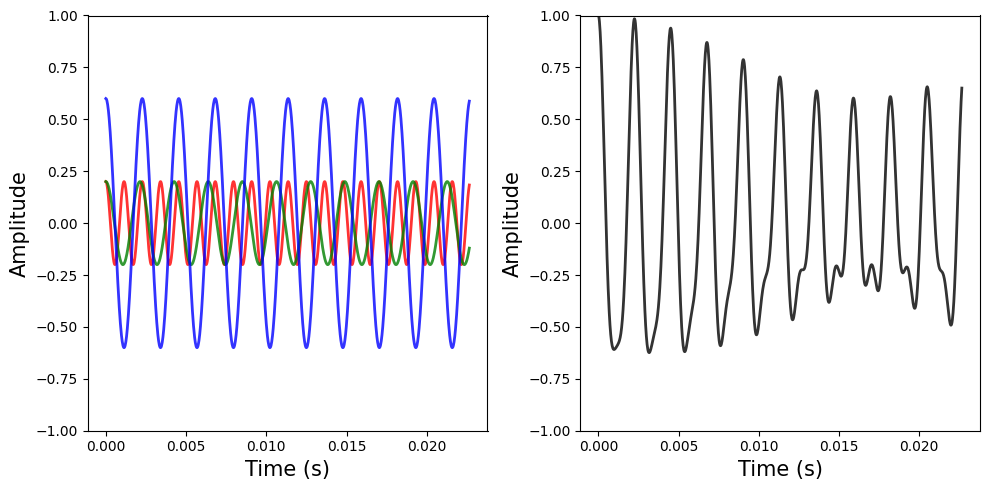

In [10]:
#@title
frequency_1 = 880    # in Hz
frequency_2 = 470    # in Hz
frequency_3 = 440    # in Hz
amplitude_1 = 0.2
amplitude_2 = 0.2
amplitude_3 = 1.0 - amplitude_1 - amplitude_2
duration = 3
frame_rate = 44100

time = np.linspace(0, duration, frame_rate * duration)
wave_1 = amplitude_1 * np.cos(time * 2 * np.pi * frequency_1)
wave_2 = amplitude_2 * np.cos(time * 2 * np.pi * frequency_2)
wave_3 = amplitude_3 * np.cos(time * 2 * np.pi * frequency_3)
wave = wave_1 + wave_2 + wave_3

# Display the results
fig = pl.figure(figsize = (10, 5))
ax = fig.add_subplot(121)
ax.plot(time[0:1000], wave_1[0:1000], color='r', lw=2, alpha=0.8)
ax.plot(time[0:1000], wave_2[0:1000], color='g', lw=2, alpha=0.8)
ax.plot(time[0:1000], wave_3[0:1000], color='b', lw=2, alpha=0.8)
ax.set_xlabel('Time (s)', fontsize = 15.0)
ax.set_ylabel('Amplitude',  fontsize = 15.0), ax.set_ylim((-1, 1))
ax = fig.add_subplot(122)
ax.plot(time[0:1000], wave[0:1000], color='k', lw=2, alpha=0.8)
ax.set_xlabel('Time (s)', fontsize = 15.0)
ax.set_ylabel('Amplitude',  fontsize = 15.0), ax.set_ylim((-1, 1))
pl.tight_layout()
pl.show()

IPython.display.Audio(wave, rate=frame_rate)

### Many frequencies combined

 - When multiple frequencies are combined, different sounds are produced.  This is why muscial instuments that play the same note sound different to each other.
 - For example, when middle C is plucked on a classical guitar, it sounds quite different to an acoustic guitar.
 - Although the same note is played, the shape of the guitar body, the string material, the wood used, and the way the string is plucked add other frequencies to the main harmonic that give the instrument its characteristic sound:

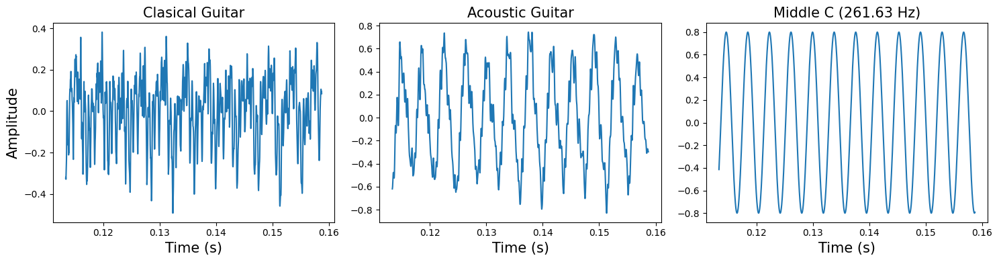

Classical guitar


Acoustic guitar


Middle C


In [11]:
import wave as wave_io
#@title
def get_waveform(wav_file):
    """ Extract a numpy array waveform from a wav file
    """
    wav = wave_io.open(wav_file, 'rb')
    wf = wav.readframes(-1)
    wf = np.frombuffer(wf, 'int16')
    t = np.arange(len(wf)).astype('float') / wav.getframerate()
    return t, np.array(wf).astype('float') / 32767.0, wav.getframerate()

fl_classical = "c_classical_loud.wav"
fl_acoustic = "c_acoustic_loud.wav"

t_classical, wf_classical, framerate_classical = get_waveform(fl_classical)
t_acoustic, wf_acoustic, framerate_acoustic = get_waveform(fl_acoustic)
wf_middle_c = np.cos(t_acoustic * 261.63 * 2 * np.pi)*0.8

idx = range(5000, 7000)
f = pl.figure(figsize = (15, 4))

ax = f.add_subplot(131)
ax.plot(t_classical[idx], wf_classical[idx])
ax.set_title('Clasical Guitar', fontsize = 15), ax.set_ylabel('Amplitude', fontsize = 15), ax.set_xlabel('Time (s)', fontsize = 15)

ax = f.add_subplot(132)
ax.plot(t_acoustic[idx], wf_acoustic[idx])
ax.set_title('Acoustic Guitar', fontsize = 15), ax.set_xlabel('Time (s)', fontsize = 15)

ax = f.add_subplot(133)
ax.plot(t_acoustic[idx], wf_middle_c[idx])
ax.set_title('Middle C (261.63 Hz)', fontsize = 15), ax.set_xlabel('Time (s)', fontsize = 15)

pl.tight_layout()
pl.show()

print("Classical guitar")
IPython.display.display(IPython.display.Audio("c_classical_loud.wav"))
print("Acoustic guitar")
IPython.display.display(IPython.display.Audio("c_acoustic_loud.wav"))
print("Middle C")
IPython.display.display(IPython.display.Audio(wf_middle_c, rate=framerate_acoustic))


## The Continuous Fourier Transform

 - Consider $\xi$ to represent ___frequency__ (e.g. in Hertz) and $\tau$ to represent ___time___ (e.g seconds)
 - Given a time-series signal $f(\tau)$, we can use the ___Fourier Transform___ to obtain the (continuous/infinite) spectrum of frequencies $F(\xi)$ that make up that signal:
 $$
F(\xi) = \text{FT}\{f(\tau) \} = \int\limits_{-\infty}^{\infty}f(\tau)e^{i2\pi\xi\tau}\text{d}\tau
 $$
 where, by Euler's formula,
 $$
  e^{ix} = \cos(x) + i\sin(x)
 $$
 - Importantly, this transform is reversible, allowing us to recover the original signal:
$$
f(\tau) = \text{FT}^{-1}\{F(\xi) \} = \int\limits_{-\infty}^{\infty}F(\xi)e^{-i2\pi\xi\tau}\text{d}\xi
$$

### 2D Fourier Transform

 - For our application (images), it is important to know that the Fourier transform naturally extends to multiple dimension:<br><br>
\begin{align}
f(x, y) = \iint\limits_{-\infty}^{\infty}F(k_{x}, k_{y})e^{-i2\pi(k_{x}x + k_{y}y)}\text{d}k_{x}\text{d}k_{y}\qquad \Leftrightarrow \qquad F(k_{x}, k_{y}) = \iint\limits_{-\infty}^{\infty}f(x, y)e^{+i2\pi(k_{x}x + k_{y}y)}\text{d}x\text{d}y\\
\end{align}<br><br>
 - We should also be aware of the __discrete__ Fourier transform, which is conventionaly calculated using the __Fast Fourier Transform__ (FFT):
 \begin{align}
  &f[i, j] = \sum\limits_{m = 0}^{M-1}\sum\limits_{n = 0}^{N-1}F[m, n]\exp\left\{-2\pi i\left(\frac{im}{M} + \frac{jn}{N}\right)\right\}\\
   \Leftrightarrow \qquad &F[m, n] = \frac{1}{MN}\sum\limits_{i = 0}^{M-1}\sum\limits_{j = 0}^{N-1}f[i, j]\exp\left\{+2\pi i\left(\frac{im}{M} + \frac{jn}{N}\right)\right\}
 \end{align}
<br><br>
 - In general the $D$-dimensional (continuous) case:
\begin{align}
f(\mathbf{x}) = \int\limits_{\mathbb{R}^{D}}F(\mathbf{k})e^{-i2\pi\mathbf{k}\cdot\mathbf{x}}\text{d}\mathbf{k} \qquad F(\mathbf{k}) = \int\limits_{\mathbb{R}^{D}}f(\mathbf{x})e^{+i2\pi\mathbf{k}\cdot\mathbf{x}}\text{d}\mathbf{x}
\end{align}



### Fourier Transform Examples

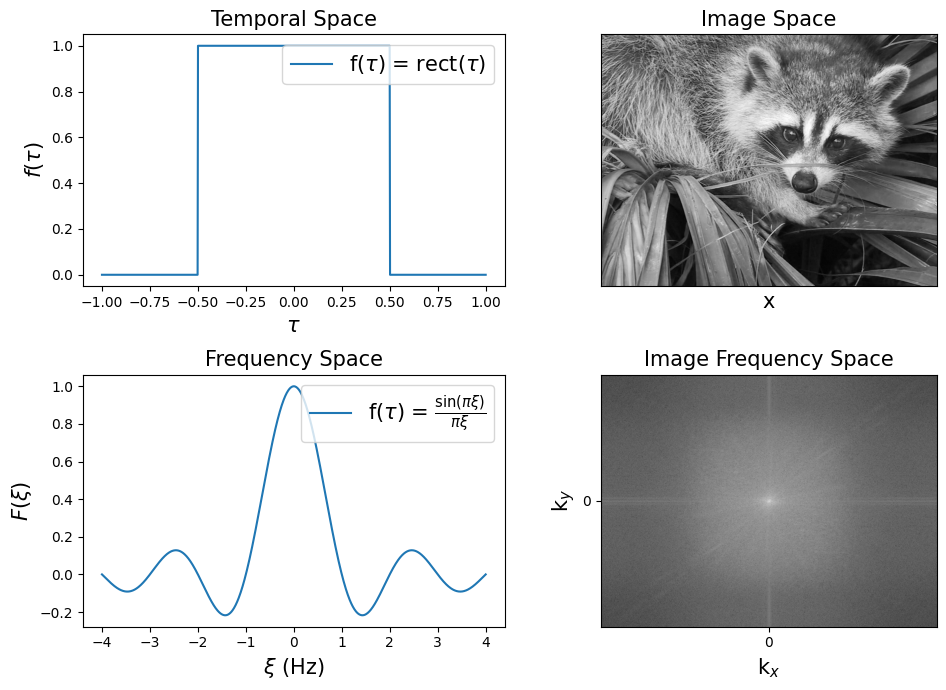

In [12]:
#@title
fig_ft_examples, axs_ft_examples = pl.subplots(2, 2, figsize = (10, 7))

# First deomnstrate the top-hat function and its Fourier Transform
a = 0.5
x_ft_examples = np.linspace(-2*a, 2*a, 1000)
top_hat = 1 * (np.abs(x_ft_examples) < a)
axs_ft_examples[0, 0].plot(x_ft_examples, top_hat, label = r'f($\tau$) = rect($\tau$)')
axs_ft_examples[0, 0].set_xlabel(r'$\tau$', fontsize = 15), axs_ft_examples[0, 0].set_ylabel(r'$f(\tau)$', fontsize = 15)
axs_ft_examples[0, 0].set_title('Temporal Space', fontsize = 15)
axs_ft_examples[0, 0].legend(loc=1, fontsize = 15)

# The fourier transform of the top-hat is the sinc function
f_ft_examples = np.linspace(-4, 4, 1000)
sinc = np.sin(2*np.pi*f_ft_examples*a) / (np.pi * f_ft_examples)
axs_ft_examples[1, 0].plot(f_ft_examples, sinc, label = r'f($\tau$) = $\frac{\sin(\pi\xi)}{\pi\xi}$')
axs_ft_examples[1, 0].set_xlabel(r'$\xi$ (Hz)', fontsize = 15), axs_ft_examples[1, 0].set_ylabel(r'$F(\xi)$', fontsize = 15)
axs_ft_examples[1, 0].set_title('Frequency Space', fontsize = 15)
axs_ft_examples[1, 0].legend(loc=1, fontsize = 15)

# Now use the FFT to determine the Fourier Transform of an image
face_R = face[:, :, 0]
axs_ft_examples[0, 1].imshow(face_R, cmap = 'gray')
axs_ft_examples[0, 1].set_xticks([]), axs_ft_examples[0, 1].set_yticks([])
axs_ft_examples[0, 1].set_xlabel(r'x', fontsize = 15), axs_ft_examples[1, 1].set_ylabel(r'y', fontsize = 15);
axs_ft_examples[0, 1].set_title('Image Space', fontsize = 15)

# Find the FFT of the face image (red channel)
face_FFT = fft.fft2(face_R)

# Find the logarithm of power spectrum of the face image
face_PS = np.log(np.abs(face_FFT))

# Shift the PS to ensure is is zero-centered
face_ZC = fft.fftshift(face_PS
                      )
axs_ft_examples[1, 1].imshow(face_ZC, cmap = 'gray', extent = (-face_R.shape[1]/2, face_R.shape[1]/2, -face_R.shape[0]/2, face_R.shape[0]/2))
axs_ft_examples[1, 1].set_xticks([0.0]), axs_ft_examples[1, 1].set_yticks([0.0])
axs_ft_examples[1, 1].set_xlabel(r'k$_{x}$', fontsize = 15), axs_ft_examples[1, 1].set_ylabel(r'k$_{y}$', fontsize = 15)
axs_ft_examples[1, 1].set_title('Image Frequency Space', fontsize = 15)

pl.tight_layout()
pl.show()

### Properties of the Fourier Transform

#### Linearity
For any complex numbers $a$ and $b$
$$
\text{FT}\{af(\tau) + bg(\tau)\} = aF(\xi) + bG(\xi)
$$
#### Time Shift
For any real number $\alpha$
$$
\text{FT}\{f(\tau + \alpha)\} = e^{- i 2\pi \alpha\xi} \cdot F(\xi)
$$
#### Frequency Shift
For any real number $\beta$
$$
\text{FT}\{e^{+i 2\pi \beta\tau} \cdot f(\tau)\} = F(\xi - \beta)
$$
#### Time Scaling
For any non-zero real value $\alpha$
$$
\text{FT}\{f(\alpha\tau)\} = \frac{1}{|\alpha|}\cdot F\left(\frac{\xi}{\alpha}\right)
$$
#### Differentiation
If $f(\tau)$ is a differentiable function then:
$$
\text{FT}\left\{\frac{\partial}{\partial\tau}f(\tau)\right\} = i2\pi\xi F(\xi)
$$<br>
(this fact can be used to help solve many complicated differential equations)

### Convolution Theorem

Consider two functions $f(\tau)$ and $g(\tau)$, and their respective Fourier transforms $F(\xi)$ and $G(\xi)$.  The Fourier transform of the convolution of the two functions equals the product of their respective Fourier transforms, and vice versa::<br><br>
$$
\text{FT}\{f(\tau) \circledast g(\tau) \} = F(\xi)\cdot G(\xi)\qquad and \qquad \text{FT}^{-1}\{F(\xi) \circledast G(\xi) \} = f(\tau)\cdot g(\tau)
$$

# __1.4 Linear Systems__

## Describing Imaging Systems

- No imaging system is perfect!  <br>
- Images only provide a reasonable approximation of the underlying object we are trying to capture. <br>
- For example, medical images typically provide some information about a particular biological property of the tissue at a given position in space, $(x, y)$ <br>
<img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_2/images/medical_image_examples.jpg?raw=true" width=400/>

- In the following slides we introduce a general formulation for characterising imaging systems.<br>
- We deonte the <b>object</b> as $f(\alpha, \beta)$ , and the <b>image</b> as $g(x, y)$<sup>1</sup><br>
- We also typically assume that $f(\alpha, \beta) \in \mathbb{R}^{+}$ and $g(x, y) \in \mathbb{R}^{+}$<br>
- In its most general sense, the imaging system can be thought of as an operator, $H$, operating on the opbject to produce the image.<br>
<img src='https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_2/images/image_object.jpg?raw=true' width = 400>

<hr></hr>
<sup>1. Here we assume we are working with 2D images, but these methods are applicable to 3 or more dimensions as well!</sup>

## Linear Imaging Systems

- Consider now that the same imaging system is used to capture images, $g_{1}(x, y)$ and $g_{2}(x, y)$, of two objects, $f_{1}(\alpha, \beta)$ and $f_{2}(\alpha, \beta)$ respectively.<br>
    <li> A <b>linear imaging system</b> is one that satisfies the following property:<br>
\begin{align}
H\left(f_{1} + f_{2}\right) &= H\left(f_{1}\right) + H\left(f_{2}\right) \\
        &= g_{1} + g_{2}
\end{align}<br>
- For example, in PET imaging, if the concentration of radioactive tracer doubles, then so does the intensity on the final image.  Another example could be doubling of the exposure time when taking a picture (although there will be a limit)<br>
- In practise nearly all imaging systems are considered to be linear.

# __1.5 Point Spread Function__

## Motivation

- Lets go back to our example of the pin-hole camera with a finite aperture.<br>
- What happens if we use a point-source at position $(\alpha, \beta)$ as the object: $f(\alpha', \beta') = \delta(\alpha' - \alpha, \beta' - \beta)$?<br>
- We will end up with the <b>point-spread function</b> (PSF) describing the imaging-system for the location of the point source, $h(x, y; \alpha, \beta)$.<br><br>
- The final image will be the sum (integral) of the contribution from all point-sources that make up the object (assuming the imaging system is linear):
$$
g(x, y) = \iint\limits_{-\infty}^{\infty} h(x, y; \alpha, \beta)\cdot f(\alpha, \beta)\text{d}\alpha\text{d}\beta
$$

<img src='https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_2/images/pinhole_projection.jpg?raw=true' width = 400>

## Shift Invariance

- If the PSF is <b>shift invariant</b> then $h$ will not change for different positions in the source frame-of-reference.<br>
- Instead, the final image will be a <b>convolution</b> of the shift-invariant PSF with the object:<br><br>
\begin{align}
g(x, y) &= \iint\limits_{-\infty}^{\infty} h(x-\alpha, y-\beta)\cdot f(\alpha, \beta)\text{d}\alpha\text{d}\beta       
\end{align}
- In practice nearly all imaging systems are considered to be shift invariant (even if it is know they are not).

<img src='https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_2/images/PSF_examples.jpg?raw=true' width = 400>


## Example of the PSF

This example taken from earlier on works as a good example of the (shift-invariant) PSF in action.  Using a Guassian distribution as the PSF and increasing the variance of the distribution appears to make the image more blurry!

In [ ]:
#@title
# Convert the red-channel of the 'face' to a floating point array (value 0 to 1):
face_R = face[:, :, 0].astype('float32')/255

# Make it smaller to speed thing up a little....
face_R = resize(face_R, (int(face_R.shape[0] / 5), int(face_R.shape[1] / 5)))

PSF_variance_slider = FloatSlider(min=0.0, max=30, step=0.5, value=0, continuous_update=False)
PSF_variance_slider.add_class("mytext")

# decorate the plot function with an environment from the UIs:
@interact(variance=PSF_variance_slider)
def convolute_PSF(variance):

    # We can't actually use zero here so just make very small.
    if variance == 0.0:
        variance = 1e-10

    # convolve with a disk of varying radius
    x = np.linspace(-20, 20, 41)
    X, Y = np.meshgrid(x, x)

    gaussian = (1.0 / (2*np.pi*np.sqrt(variance))) * np.exp(-0.5 * (X**2 + Y**2) / variance)

    f = pl.figure(figsize = (10, 6))
    ax1 = f.add_subplot(131)
    ax1.imshow(gaussian / gaussian.max(), cmap = 'gray', clim = (0, 1), interpolation = 'None')
    ax1.set_title(r'$PSF, h(x - \alpha, y - \beta)$', fontsize = 15.0)

    ax2 = f.add_subplot(132)
    ax2.imshow(face_R, cmap = 'gray', interpolation = 'None')
    ax2.set_title(r'$f(\alpha, \beta)$', fontsize = 15.0)

    ax3 = f.add_subplot(133)
    ax3.imshow(convolve2d(face_R, gaussian, mode='same'), cmap = 'gray', interpolation = 'None')
    ax3.set_title(r'$g(x, y)$', fontsize = 15.0)

    pl.show()

interactive(children=(FloatSlider(value=0.0, continuous_update=False, description='variance', max=30.0, step=0…

# __1.6 Transfer Functions__

## Motivation

- Recall the convoilution theorem, which states that the Fourier transform of the convolution between two signals, $f$ and $h$, is equal to the product of the fourier trannform of each signal, $F$ and $H$ respectively. <br>
- In two-dimensions this means that we have:<br>
\begin{align}
   \text{FT}\left\{ g(x, y) \right\} &= \text{FT}\left\{\iint\limits_{-\infty}^{\infty}h(x-\alpha, y-\beta)\cdot f(\alpha, \beta)\text{d}\alpha \text{d}\beta \right\}\\\\
    &= \text{FT}\left\{h(x, y)\right\} \cdot \text{FT}\left\{f(x, y)\right\} \\\\
    \therefore G(k_{x}, k_{y}) &= H(k_{x}, k_{y})\cdot F(k_{x}, k_{y})
\end{align}<br>
- $H(k_{x}, k_{y})$, the Fourier transform of the point-spread function, is called the <b>Optical Transfer Function</b> (OTF) <br>
- In general, the OTF is complex valued and so it can be simpler to define the <b>Modulation Transfer Function</b> (MTF) as the absolute value:<br>
\begin{align}
\text{MTF} &= |\text{OTF}| = |H(k_{x}, k_{y})|
\end{align}


- $F$ describes the frequencies present in the <i>object</i> and $G$ the frequencies in the <i>image</i><br>
- If the magnitude of $H$ (i.e. the MTF) is low, then these frequencies in object are attenuated in the final image (i.e. modulations in the object at these frequencies are not <i>transferred</i> into the image!)

\begin{gather*}
\text{image frequencies} = \text{OTF} \cdot \text{object frequencies} \\\\
G(k_{x}, k_{y}) = H(k_{x}, k_{y})\cdot F(k_{x}, k_{y}) \\\\
\text{MTF} = |H(k_{x}, k_{y})|
\end{gather*}

In [ ]:
#@title
# Convert the red-channel of the 'face' to a floating point array (value 0 to 1):
face_R = face[:, :, 0].astype('float32')/255

# Make it smaller to speed thing up a little....
face_R = resize(face_R, (int(face_R.shape[0] / 5), int(face_R.shape[1] / 5)))

PSF_width_slider = FloatSlider(min=0.0, max=30, step=0.5, value=0, continuous_update=False)
log_scale_check = Checkbox()

# decorate the plot function with an environment from the UIs:
@interact(width=PSF_width_slider, log_scale = log_scale_check)
def compute_MTF(width, log_scale):

    # We can't actually use zero here so just make very small.
    if width == 0.0:
        width = 1e-10

    # convolve with a disk of varying radius
    x = np.linspace(-20, 20, 41)
    X, Y = np.meshgrid(x, x)

    PSF = 1.0 * np.logical_and(np.abs(X) <= width / 2, np.abs(Y) <= width / 2)
    PSF_1D = 1.0 * (np.abs(x) <= width / 2)
    kx = fft.fftshift(fft.fftfreq(len(x), 40))
    MTF = np.abs(fft.ifftshift(fft.fft(fft.fftshift(PSF_1D))))
    MTF = MTF/MTF[21]

    image = convolve2d(face_R, PSF, mode='same')

    f = pl.figure(figsize = (12, 5))
    ax1 = f.add_subplot(231)
    ax1.imshow(face_R, cmap = 'gray', interpolation = 'None')
    ax1.set_title(r'Object $f(\alpha, \beta)$', fontsize = 15.0)
    ax1.set_xticks([]), ax1.set_yticks([])

    ax2 = f.add_subplot(232)
    ax2.plot(PSF_1D, 'k-')
    ax2.set_title(r'PSF $h(\alpha)$', fontsize = 15.0)
    ax2.set_xticks([]), ax2.set_yticks([])

    ax3 = f.add_subplot(233)
    ax3.imshow(image, cmap = 'gray', interpolation = 'None')
    ax3.set_title(r'Image $g(x, y)$', fontsize = 15.0)
    ax3.set_xticks([]), ax3.set_yticks([])


    row_object = face_R[75, :]
    row_object_fft = fft.ifftshift(fft.fft(fft.fftshift(row_object)))

    row_image = image[75, :]
    row_image_fft = fft.ifftshift(fft.fft(fft.fftshift(row_image)))

    ax4 = f.add_subplot(234)
    if log_scale:
        ax4.semilogy(np.abs(row_object_fft/row_object_fft.max()), 'k-')
        ax4.set_ylim((6e-4, 1))
    else:
        ax4.plot(np.abs(row_object_fft/row_object_fft.max()), 'k-')
    ax4.set_title(r'$F(k_{x})$', fontsize = 15.0)
    ax4.set_xticks([])

    ax5 = f.add_subplot(235)
    if log_scale:
        ax5.semilogy(MTF, 'k-')
        ax5.set_ylim((6e-4, 1))
    else:
        ax5.plot(MTF, 'k-')
    ax5.set_title(r'MTF $H(k_{x})$', fontsize = 15.0)
    ax5.set_xticks([])

    ax6 = f.add_subplot(236)
    if log_scale:
        ax6.semilogy(np.abs(row_image_fft/row_image_fft.max()), 'k-')
        ax6.set_ylim((6e-4, 1))
    else:
        ax6.plot(np.abs(row_image_fft/row_image_fft.max()), 'k-')
    ax6.set_title(r'$G(k_{x})$', fontsize = 15.0)
    ax6.set_xticks([])

    pl.tight_layout()

    pl.show()

interactive(children=(FloatSlider(value=0.0, continuous_update=False, description='width', max=30.0, step=0.5)…

# __1.7 The Comb and Rectangle Functions__

## Motivation

- Recall that an image is typically represented by 'pixels'.<br>
- The 'object' that we are trying to image will typically be continuous, whilst in the image we can only take a 'sample' of the spatial positions.<br>
- In addition, we can never sample the whole scene.  We only capture a small range of it.

<img src = "https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_2/images/FOV_resolution.jpg?raw=true" width = 400>

In [ ]:
#@title
# Extract the red colour channel from the image
R_channel = face[::-1, :, 0]

zoom_slider = FloatSlider(min=1.00, max=70.0, step=1, value=1.0, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(zoom=zoom_slider)
def plot_zoom(zoom):
    fig = pl.figure(figsize = (18, 5))
    ax = fig.add_subplot(111)
    ax.imshow(R_channel, cmap = 'gray', interpolation = 'None', origin = 'upper')

    # Set the viewport to display a zoomed in version of the image
    zoom_factor = 1.0/zoom
    xRange = [int(face.shape[1] / 2 * (1 - zoom_factor)), int(face.shape[1] / 2 * (1 + zoom_factor))]
    yRange = [int(face.shape[0] / 2 * (1 - zoom_factor)), int(face.shape[0] / 2 * (1 + zoom_factor))]
    ax.set_xlim(*xRange)
    ax.set_ylim(*yRange)
    ax.set_xticks([]), ax.set_yticks([])

    # If the zoom factor is high enough then display the pixel values
    if zoom >= 50:
        for i in range(xRange[0]+1, xRange[1]):
            for j in range(yRange[0]+1, yRange[1]):
                if R_channel[j, i] < 100:
                    color = 'w'
                else:
                    color = 'k'
                ax.text(i, j, "%d"%R_channel[j, i],
                        verticalalignment = 'center', horizontalalignment = 'center',
                        color = color, fontsize = 10)

    pl.show()

interactive(children=(FloatSlider(value=1.0, continuous_update=False, description='zoom', max=70.0, min=1.0, s…

## The Comb and Rect Functions

 - How can we represent this mathematically? <br>
 - We can make use of two neat functions, 'comb' and 'rect', which allow us to model the sampling process:<br>
 > $comb(x, r_{x}) = \frac{1}{r_{x}}\cdot\sum_{n = -\infty}^{\infty}\delta\left(\frac{x}{r_{x}} - n\right)$<br><br>
 > $rect(x, r_{x}) = \begin{cases}1, |x| < \frac{r_{x}}{2} \\ \frac{1}{2}, |x| = \frac{r_{x}}{2} \\ 0, |x| > \frac{r_{x}}{2} \end{cases} $<br>

 - What does this do for the image frequencies?<br>

(Note: The steps we take below are in 1D but can be extended to 2D where required.)

<ipython-input-41-db1a2239bf37>:51: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  ax4.set_yticks([]), ax4.set_xticks([-3, 3], ["-r$_{x}$/2", "r$_{x}$/2"])


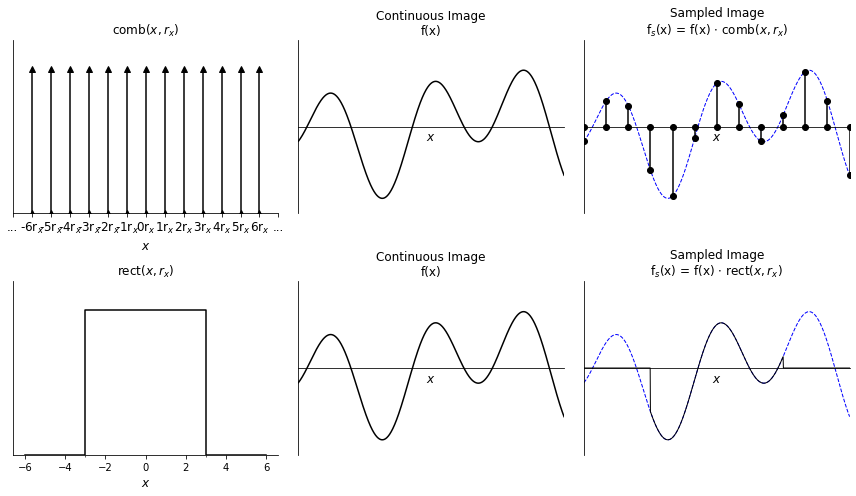

In [ ]:
#@title
def example_function(x):
    return 0.6*np.cos(np.pi*2*0.23*x) + 0.4*np.sin(np.pi*2*0.1*x)

def plot_sampling_functions():
    fs = 12.0

    f = pl.figure(figsize = (12, 7))

    ax1 = f.add_subplot(231)
    x = np.linspace(-6, 6, 13)
    xticks = ['...']
    for x_ in x:
        ax1.plot([x_, x_], [0, 1], 'k^-')
        xticks.append(r'%dr$_{x}$'%x_)
    xticks.append('...')
    pl.xticks(np.linspace(-7, 7, 15), xticks, fontsize = fs)
    ax1.set_ylim((0, 1.2))
    ax1.set_yticks([])
    ax1.set_title(r'comb$(x, r_{x})$', fontsize = fs)
    ax1.set_xlabel(r'$x$', fontsize = fs)
    ax1.spines['right'].set_visible(False), ax1.spines['top'].set_visible(False)

    ax2 = f.add_subplot(232)
    x_continous = np.linspace(-6, 6, 1000)
    f_continuous = example_function(x_continous)
    ax2.plot(x_continous, f_continuous, 'k-')
    ax2.set_xlim(-6, 6), ax2.set_ylim((-1.2, 1.2))
    pl.xticks([]), pl.yticks([])
    ax2.set_title("Continuous Image\nf(x)", fontsize = fs)
    ax2.set_xlabel(r'$x$', fontsize = fs)
    ax2.spines['bottom'].set_position('center')
    ax2.spines['right'].set_visible(False), ax2.spines['top'].set_visible(False)

    ax3 = f.add_subplot(233)
    f_sampled = example_function(x)
    ax3.plot(x_continous, f_continuous, 'b--', lw = 1.0)
    for i in range(len(x)):
        ax3.plot([x[i], x[i]], [0, f_sampled[i]], 'ko-')
    ax3.set_xlim(-6, 6), ax3.set_ylim((-1.2, 1.2))
    pl.xticks([]), pl.yticks([])
    ax3.set_title("Sampled Image\nf$_{s}$(x) = f(x) $\cdot$ comb$(x, r_{x})$", fontsize = fs)
    ax3.set_xlabel(r'$x$', fontsize = fs)
    ax3.spines['bottom'].set_position('center')
    ax3.spines['right'].set_visible(False), ax3.spines['top'].set_visible(False)

    ax4 = f.add_subplot(234)
    x = np.linspace(-6, 6, 13)
    ax4.plot([-6, -3, -3, 3, 3, 6], [0, 0, 1, 1, 0, 0], 'k-')
    ax4.set_ylim((0, 1.2))
    ax4.set_yticks([]), ax4.set_xticks([-3, 3], ["-r$_{x}$/2", "r$_{x}$/2"])
    ax4.set_title(r'rect$(x, r_{x})$', fontsize = fs)
    ax4.set_xlabel(r'$x$', fontsize = fs)
    ax4.spines['right'].set_visible(False), ax4.spines['top'].set_visible(False)

    ax5 = f.add_subplot(235)
    x_continous = np.linspace(-6, 6, 1000)
    f_continuous = example_function(x_continous)
    ax5.plot(x_continous, f_continuous, 'k-')
    ax5.set_xlim(-6, 6), ax5.set_ylim((-1.2, 1.2))
    pl.xticks([]), pl.yticks([])
    ax5.set_title("Continuous Image\nf(x)", fontsize = fs)
    ax5.set_xlabel(r'$x$', fontsize = fs)
    ax5.spines['bottom'].set_position('center')
    ax5.spines['right'].set_visible(False), ax5.spines['top'].set_visible(False)

    ax6 = f.add_subplot(236)
    ax6.plot(x_continous, f_continuous, 'b--', lw = 1.0)
    f_continuous[np.abs(x_continous) > 3] = 0
    ax6.plot(x_continous, f_continuous, 'k-', lw = 1.0)
    ax6.set_xlim(-6, 6), ax6.set_ylim((-1.2, 1.2))
    pl.xticks([]), pl.yticks([])
    ax6.set_title("Sampled Image\nf$_{s}$(x) = f(x) $\cdot$ rect$(x, r_{x})$", fontsize = fs)
    ax6.set_xlabel(r'$x$', fontsize = fs)
    ax6.spines['bottom'].set_position('center')
    ax6.spines['right'].set_visible(False), ax6.spines['top'].set_visible(False)

    pl.tight_layout()
    pl.show()

plot_sampling_functions()

# __1.8 Finite Apertures and Sampling Rates__

## Motivation

- We know that the ferquency components of a continuous function, $f(x)$, can be found from its Fourier transform:
$$
 F(k_{x}) = \text{FT}\{f(x)\} = \int\limits_{-\infty}^{\infty}f(x)e^{-i2\pi k_{x}x}\text{d}x
$$
- So what is the Fourier transform of the sampled image:<br>
\begin{align}
 F_{s}(k_{x}) &= \text{FT}\left\{f(x) \cdot  \text{comb}(x, r_{x}) \right\} \\\\
              &= \text{FT}\left\{f(x)\right\} \circledast \text{FT}\left\{\text{comb}(x, r_{x})\right\} \qquad \text{(Convolution Theorem)}\\\\
              &= F(k_{x})  \circledast \left\{r_{x}\cdot\text{comb}\left(k_{x}, 1/r_{x}\right)\right\}
\end{align}<br>

- The first of these terms is the frequency spectrum of the true (unsampled) scene. <br>
- The second term means that the frequency spectrum is repeated with periods of $\frac{1}{r_{x}}$.  This can lead to __aliasing__, which degrades the final image quality.

## The Nyquist-Shannon Theorem

- Consider the illustration below, which demonstrates the effect of convolving the continuous imaging frequency spectrum with a comb function with spacing 1 / r$_{x}$. <br>
- Due to the overlap of the periodic spectra, any frequencies with $|k_{x}| > \frac{1}{2r_{x}}$ are affected by overlap with the next repetation of frequencies.  <br>
- The __bandwidth__ of such a system is thus $\Omega = \frac{1}{2r_{x}}$ (this can be thought of as the field-of-view of the frequency domain).<br>
- Any frequencies in the image greater than this limit cannot be resolved!

In [13]:
#@title

fs = 15.0

x_sampled = np.linspace(-4, 4, 9)
x_continous = np.linspace(-6, 6, 1000)

f_continuous = example_function(x_continous)
f_sampled = example_function(x_sampled)

# Note!  These data are fake and for illiustrative purposes only.
F_continuous = np.abs(np.sinc(5*x_continous))
F_sampled = F_continuous + np.roll(F_continuous, -int(len(F_continuous)/4)) + np.roll(F_continuous, int(len(F_continuous)/4)) + np.roll(F_continuous, -int(len(F_continuous)/2))
F_sampled = F_sampled / F_sampled.max()

f = pl.figure(figsize = (12, 5))

ax1 = f.add_subplot(121)
ax1.plot(x_continous, f_continuous, 'r-', label = "Image, f(x)", zorder = 1)

for i in range(len(x_sampled)):
    if i == 0:
        ax1.plot([x_sampled[i], x_sampled[i]], [0, f_sampled[i]], 'ko-', label = "Sampled Image, f$_{s}$(x)", zorder = 2)
    else:
        ax1.plot([x_sampled[i], x_sampled[i]], [0, f_sampled[i]], 'ko-', zorder = 2)


ax1.set_xlim(-6, 6), ax1.set_ylim((-1.4, 1.4))
pl.xticks([]), pl.yticks([])
ax1.set_xlabel(r'$x$', fontsize = fs)
ax1.spines['bottom'].set_position('center')
ax1.spines['right'].set_visible(False), ax1.spines['top'].set_visible(False)
pl.legend(loc = 1, fontsize = 12)

ax2 = f.add_subplot(122)
ax2.plot(x_continous, F_continuous, 'r-', label = "Image Frequencies, F(k$_{x}$)", zorder = 2)
ax2.plot(x_continous, F_sampled, 'k-', label = "Sampled Image Frequencies, F$_{s}$(k$_{x}$)", zorder = 1)
ax2.set_xlim(-6, 6), ax2.set_ylim((0, 1.3))
pl.yticks([]), pl.xticks([-6, -3, 0, 3, 6], ["$\\frac{-2}{r_{x}}$", "$\\frac{-1}{r_{x}}$", "$\\frac{0}{r_{x}}$", "$\\frac{1}{r_{x}}$", "$\\frac{2}{r_{x}}$"], fontsize = fs)
ax2.set_xlabel(r'$k_{x}$', fontsize = fs)
ax2.spines['right'].set_visible(False), ax2.spines['top'].set_visible(False)
pl.legend(loc = 1, fontsize = 12)

pl.show()

NameError: name 'example_function' is not defined

# __1.9 Aliasing__

## Motivation

- For sampling frequencies $\frac{1}{r_{x}} \leq 2\Omega$, then the signal becomes __aliased__:

In [14]:
#@title
freqeuncy_slider = FloatSlider(min=0.0, max=120, step=0.5, value=30, continuous_update=False)
sampling_freqeuncy_slider = FloatSlider(min=0.0, max=300, step=1, value=300, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(frequency=freqeuncy_slider, sample_freq = sampling_freqeuncy_slider)
def convolute_PSF(frequency, sample_freq):

    f = pl.figure(figsize = (15, 6))

    x_full = np.linspace(-0.5, 0.5, 1000)
    signal_full = np.cos(2*np.pi*x_full*frequency)

    x_sampled = np.linspace(-0.5, 0.5, int(sample_freq)+1)
    signal_sampled = np.cos(2*np.pi*x_sampled*frequency)

    ax1 = f.add_subplot(121)
    ax1.plot(x_full, signal_full, 'k-', lw = 2.0)
    ax1.plot(x_sampled, signal_sampled, 'ro', ms = 4)
    ax1.set_xlabel("x")

    ax2 = f.add_subplot(122)
    ax2.plot(x_sampled, signal_sampled, 'k-', lw = 2.0)
    ax2.set_xlabel("x")

    pl.show()

interactive(children=(FloatSlider(value=30.0, continuous_update=False, description='frequency', max=120.0, ste…

 - What does this mean for images?

In [ ]:
#@title
# Convert the red-channel of the 'face' to a floating point array (value 0 to 1):
face_R = face[:, :, 0].astype('float32')/255

sample_slider = IntSlider(min=1, max=20, step=1, value=1, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(sample_rate=sample_slider)
def aliasing(sample_rate):

    f = pl.figure(figsize = (7, 7))
    ax = f.add_subplot(111)
    ax.imshow(face_R[0::sample_rate, 0::sample_rate], cmap = 'gray', interpolation = 'None')
    ax.set_xticks([]), ax.set_yticks([])
    pl.show()

interactive(children=(IntSlider(value=1, continuous_update=False, description='sample_rate', max=20, min=1), O…

## Anti-aliasing

- To help remove the effects of aliasing, one approach is to blur the images first (pre-sample blurring).<br>
- Why does this work?

In [ ]:
#@title
from skimage.morphology import disk
from skimage.filters import rank

# Convert the red-channel of the 'face' to a floating point array (value 0 to 1):
face_R = face[:, :, 0].astype('float32')/255

blur_sample_slider = IntSlider(min=1, max=20, step=1, value=1, continuous_update=False)
blur_window_slider = IntSlider(min=1, max=20, step=1, value=1, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(sample_rate=blur_sample_slider, blur_window = blur_window_slider)
def blur_aliasing(sample_rate, blur_window):

    element = disk(blur_window)
    face_R_blur = rank.mean(face_R, selem=element)

    f = pl.figure(figsize = (12, 10))

    ax1 = f.add_subplot(121)
    ax1.imshow(face_R[0::sample_rate, 0::sample_rate], cmap = 'gray', interpolation = 'None')
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Original Image")

    ax2 = f.add_subplot(122)
    ax2.imshow(face_R_blur[0::sample_rate, 0::sample_rate], cmap = 'gray', interpolation = 'None')
    ax2.set_xticks([]), ax2.set_yticks([])
    ax2.set_title("Blurred Image")

    pl.tight_layout()

    pl.show()

interactive(children=(IntSlider(value=1, continuous_update=False, description='sample_rate', max=20, min=1), I…

## Bandwidth

- We are missing one component!<br>
- We now know that any frequencies $|k_{x}| > \frac{1}{2r_{x}}$ should be ignored.<br>
- Our imaging system is there __bandlimited__:
$$
 -\frac{1}{2r_{x}} < k_{x} < \frac{1}{2r_{x}}
$$<br>
- This is equivalent to multiplying the full frequency space with a __rectangle function__:
<br><br>
$$
 F^{*}_{s}(k_{x}) = \text{rect}(k_{x}\cdot r_{x}) \cdot F_{s}(k_{x})
$$

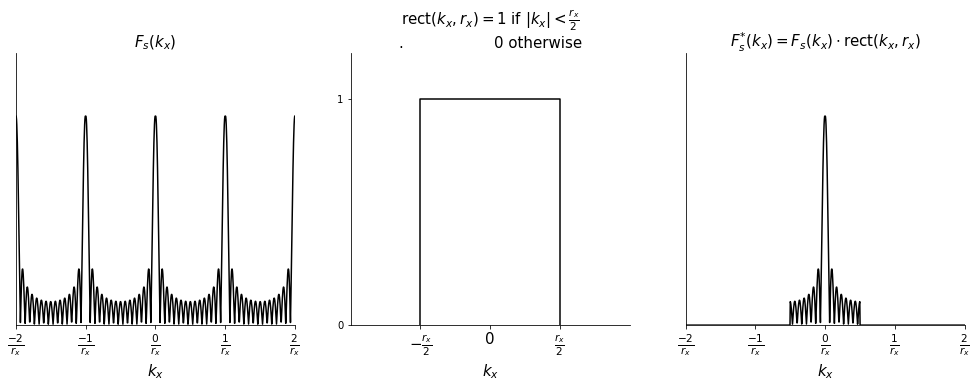

In [ ]:
#@title
def plot_bandlimited():

    fs = 15.0

    x_continous = np.linspace(-6, 6, 1000)
    F_continuous = np.abs(np.sinc(5*x_continous))
    F_sampled = F_continuous + np.roll(F_continuous, -int(len(F_continuous)/4)) + np.roll(F_continuous, int(len(F_continuous)/4)) + np.roll(F_continuous, -int(len(F_continuous)/2))
    F_sampled = F_sampled / F_sampled.max()

    f = pl.figure(figsize = (17, 5))

    ax1 = f.add_subplot(131)
    ax1.plot(x_continous, F_sampled, 'k-', label = "Sampled, $F(k_{x})$", zorder = 1)
    ax1.set_xlim(-6, 6), ax1.set_ylim((0, 1.3))
    pl.yticks([]), pl.xticks([-6, -3, 0, 3, 6], ["$\\frac{-2}{r_{x}}$", "$\\frac{-1}{r_{x}}$", "$\\frac{0}{r_{x}}$", "$\\frac{1}{r_{x}}$", "$\\frac{2}{r_{x}}$"], fontsize = fs)
    ax1.set_xlabel(r'$k_{x}$', fontsize = fs)
    ax1.spines['right'].set_visible(False), ax1.spines['top'].set_visible(False)
    ax1.set_title("$F_{s}(k_{x})$", fontsize = fs)

    ax2 = f.add_subplot(132)
    ax2.plot([-0.5, -0.5, 0.5, 0.5], [0, 1, 1, 0], 'k-')
    pl.xticks((-0.5, 0, 0.5), (r'$-\frac{r_{x}}{2}$', '0', r'$\frac{r_{x}}{2}$'), fontsize = fs)
    ax2.set_xlim(-1, 1), ax2.set_ylim((0, 1.2))
    pl.yticks([0, 1])
    ax2.set_title("rect$(k_{x}, r_{x}) = 1 $ if $|k_{x}| < \\frac{r_{x}}{2}$\n.                   0 otherwise", fontsize = fs)
    ax2.set_xlabel(r'$k_{x}$', fontsize = fs)
    ax2.spines['right'].set_visible(False), ax2.spines['top'].set_visible(False)

    ax3 = f.add_subplot(133)
    F_sampled[np.abs(x_continous) > 1.5] = 0
    ax3.plot(x_continous, F_sampled, 'k-')
    ax3.set_xlim(-6, 6), ax3.set_ylim((0, 1.3))
    pl.yticks([]), pl.xticks([-6, -3, 0, 3, 6], ["$\\frac{-2}{r_{x}}$", "$\\frac{-1}{r_{x}}$", "$\\frac{0}{r_{x}}$", "$\\frac{1}{r_{x}}$", "$\\frac{2}{r_{x}}$"], fontsize = fs)
    ax3.set_xlabel(r'$k_{x}$', fontsize = fs)
    ax3.spines['right'].set_visible(False), ax3.spines['top'].set_visible(False)
    ax3.set_title("$F^{*}_{s}(k_{x}) = F_{s}(k_{x})\cdot$rect($k_{x}, r_{x}$)", fontsize = fs)

    pl.show()

plot_bandlimited()

- Our image is the inverse FT of this function:<br><br>
\begin{align}
 f_{s}(x) &= \text{FT}^{-1}\left\{F_{s}(k_{x})\cdot\text{rect}(k_{x}, r_{x})\right\}\\
          &= \text{FT}^{-1}\left\{F_{s}(k_{x})\right\}\circledast\text{FT}^{-1}\left\{\text{rect}(k_{x}, r_{x})\right\}\\
          & = (f(x) \cdot  \text{comb}(x, r_{x})) \circledast \text{sinc}\left(\frac{x}{r_{x}}\right) \qquad \text{(Whittaker-Shannon interpolation formula in 1D)}
 \end{align}

In [ ]:
#@title
rx_slider = IntSlider(min=10, max=40, step=1, value=1, continuous_update=False, description = '\(r_{x}\)')

@interact(rx=rx_slider)
def demo_sinc_conv(rx):

    face_ds = face_R[0::5, 0::5]

    x = np.arange(-face_ds.shape[0]/8, +face_ds.shape[0]/8)
    X, Y = np.meshgrid(x, x)

    f = pl.figure(figsize = (25, 7))

    # Sinc/sombrero function
    r = np.sqrt(X**2 + Y**2)
    kernel = np.sinc(r / (0.1*rx))
    ax = f.add_subplot(111)
    ax.imshow(convolve2d(face_ds, kernel), cmap = 'gray')
    ax.set_xticks([]), ax.set_yticks([])

    pl.show()

interactive(children=(IntSlider(value=10, continuous_update=False, description='\\(r_{x}\\)', max=40, min=10),…

## Discrete Sampling

- For discrete images, this gives us an important relationship between the resolution and field-of-view of image and frequency spaces:

<img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_2/images/FOV_resolution_freq.jpg?raw=true" width = 600>

# __Lecture 2__

# 2.1 __Motivation Behind Image Enhancement__

Enhancement methods are commonly commonly applied to image pixel intensities to improve image in some way.<br>
This could include (amongst many others):
- Improving the <b>contrast</b> in the image to highlight a specific areas>
- Adjusting the <b>brightness</b> of the image to help adjust for account for background lighting.
- Reducing the amount of <b>noise</b> in the image.
- Enhancing specific <b>features</b> in the image such as edges.

__Filters__ generally fall into 3 classes:
- ___Point operators___ modify individual pixel levels in some way, for example to modify the contrast or brightness in the image.
- ___Spatial operators___ modify the pixel values in some way, but also take into consideration the <b>neighborhood</b> of the pixel.
- ___Transform operators___ modify the pixels after some transformation of the image. For example this could be modification of frequency space after Fourier transformation of the image.

## Brightness

- Computer monitors are able to output a range of intensities for each of the color channels.
- In RGB color space, a common approach is to split the value of each color channel into 256 (2$^{8}$) values, ranging from 0 meaning no color luminance to 255 meaning full color luminance.

In [15]:
#@title
red_slider = IntSlider(min=0, max=255, step=1, value=255, continuous_update=False)
blue_slider = IntSlider(min=0, max=255, step=1, value=255, continuous_update=False)
green_slider = IntSlider(min=0, max=255, step=1, value=255, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(red = red_slider, green = green_slider, blue = blue_slider)
def rgb_example(red, green, blue):

    r = np.ones((1, 1))*red
    g = np.ones((1, 1))*green
    b = np.ones((1, 1))*blue
    rgb = np.stack((r, g, b)).transpose(1, 2, 0).astype('uint8')

    f = pl.figure(figsize = (3, 3))
    ax = f.add_subplot(111)
    ax.imshow(rgb)
    ax.set_xticks([]), ax.set_yticks([])
    pl.show()

interactive(children=(IntSlider(value=255, continuous_update=False, description='red', max=255), IntSlider(val…

## Contrast

- Contrast describes the relative difference in luminance between two objects being viewed in an image.<br><br>
- There are a number of possible definitions for contrast:<br><br>
 \begin{align}
  \text{Weber Contrast:}\qquad C_{w} &= \frac{I_{2} - I_{1}}{I_{1}}, \qquad C_{w} \in [-1, \infty]\\
  \text{Michelson Contrast:}\qquad C_{m} &= \frac{I_{2} - I_{1}}{I_{1} + I_{2}}, \qquad C_{m} \in [-1, 1]\\
 \end{align}

In [17]:
#@title
contrast_slider = FloatSlider(min=-1, max=1, step=0.01, value=0, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(contrast = contrast_slider)
def contrast_example(contrast):

    I_1 = np.ones((1, 1)) * (1.0 - contrast) / 2
    I_2 = np.ones((1, 1)) * (1.0 + contrast) / 2

    f = pl.figure(figsize = (8, 4))

    ax1 = f.add_subplot(121)
    ax1.imshow(I_1, cmap = 'gray', clim = (0, 1))
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("$I_{1}$")

    ax2 = f.add_subplot(122)
    ax2.imshow(I_2, cmap = 'gray', clim = (0, 1))
    ax2.set_xticks([]), ax2.set_yticks([])
    ax2.set_title("$I_{2}$")

    pl.show()

interactive(children=(FloatSlider(value=0.0, continuous_update=False, description='contrast', max=1.0, min=-1.…

# __2.2 Point Operators__

## Background

 - Operations that are carried out on each pixel value independently. <br>
 - Generally modify the __histogram__ of the image instensities, which describes the number of pixels within an image that have pixel intensities within a given range.

In [ ]:
#@title
face_R = face[:, :, 0]

binwidth_slider = FloatSlider(min=1, max=20, step=1, value=5, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(bin_width = binwidth_slider)
def histogram_example(bin_width):

    f = pl.figure(figsize = (10, 4))

    ax1 = f.add_subplot(121)
    ax1.imshow(face_R, cmap = 'gray')
    ax1.set_xticks([]), ax1.set_yticks([])

    ax2 = f.add_subplot(122)
    ax2.hist(face_R.ravel(), bins = int(face_R.max() / bin_width), color = 'b')
    ax2.set_xlabel('Pixel intensity'), ax2.set_ylabel('Number of pixels')

    pl.tight_layout()
    pl.show()

interactive(children=(FloatSlider(value=5.0, continuous_update=False, description='bin_width', max=20.0, min=1…

## Contrast Stretching

 - Many images (e.g. medical images) don't have pixel intesities within the required range (0, 255).<br><br>
 - It is therefore necessary to transform the input pixels into this range in some way for display.<br><br>
 - Contrast stretching allows the user to interactively alter the pixel values according to a simple transformation known as __windowing__:<br>
 \begin{align}
     I_{out} = \alpha\cdot I_{in} + \beta
 \end{align}<br>
 - $\alpha$ is sometimes called the 'window width', whilst $\beta$ is sometimes known as the 'window level'.<br><br>
 - The final result is then typically __clipped__ to ensure that the output values, $I_{out}$, are within the range [0, 255].

In [18]:
#@title
face_R = face[:, :, 0]

alpha_slider = FloatSlider(min=0, max=3, step=0.01, value=1, continuous_update=False)
beta_slider = FloatSlider(min=-255, max=255, step=1, value=0, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(alpha = alpha_slider, beta = beta_slider)
def windowing_example(alpha, beta):

    f = pl.figure(figsize = (8, 3))

    I_out = np.clip(alpha*face_R + beta, 0, 255)

    ax1 = f.add_subplot(121)
    ax1.imshow(I_out, cmap = 'gray', clim = (0, 255))
    ax1.set_xticks([]), ax1.set_yticks([])

    ax2 = f.add_subplot(122)
    ax2.hist(face_R.ravel(), bins = 255, color = 'b')
    ax2.set_xlabel('Pixel intensity'), ax2.set_ylabel('Number of pixels')

    x = np.linspace(face_R.min(), face_R.max(), 200)
    ax3 = ax2.twinx()
    ax3.plot(x, np.clip(alpha*x + beta, 0, 255), 'r-', lw = 4.0)
    ax3.set_ylabel("Output Pixel Intensity")
    ax3.set_ylim((0, 255))

    pl.tight_layout()
    pl.show()

interactive(children=(FloatSlider(value=1.0, continuous_update=False, description='alpha', max=3.0, step=0.01)…

## Histogram Equalization

 - A nice feature of contrast stretching is its interactive nature; it is up to the user to try and identify the best windowing settings for the display they want.<br>
 - However, this manual approach limits the number of 'degrees of freedom' to 2 ($\alpha$ and $\beta$).<br>
 - __Histogram Equaliztion__ is a method to automatically modify the pixel intesnity at each pixel location so that the image histogram becomes uniform over the given pixel range:

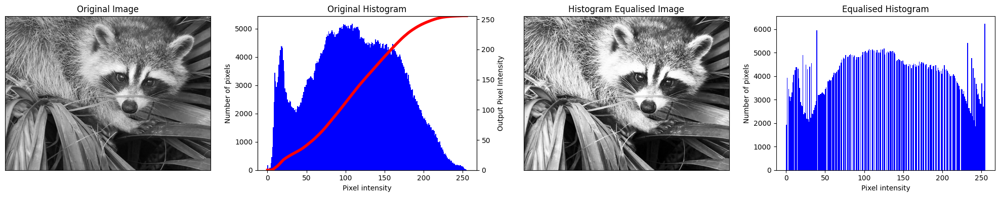

In [19]:
#@title
face_R = face[:, :, 0]

def histogram_equalisation():

    f = pl.figure(figsize = (20, 4))

    # Note: This is not the most efficient way to do this, but demontrates the principle
    hist, _ = np.histogram(face_R, bins = 256, density=True)
    transfer_function = np.cumsum(hist)*255

    face_R_normed = face_R.copy()
    for i in range(face_R.shape[0]):
        for j in range(face_R.shape[1]):
            face_R_normed[i, j] = transfer_function[face_R[i, j]]

    ax1 = f.add_subplot(141)
    ax1.imshow(face_R, cmap = 'gray', clim = (0, 255))
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Original Image")

    ax2 = f.add_subplot(142)
    ax2.hist(face_R.ravel(), bins = 255, color = 'b')
    ax2.set_xlabel('Pixel intensity'), ax2.set_ylabel('Number of pixels')
    ax2.set_title("Original Histogram")

    ax_xtra = ax2.twinx()
    ax_xtra.plot(transfer_function, 'r-', lw = 4.0)
    ax_xtra.set_ylabel("Output Pixel Intensity")
    ax_xtra.set_ylim((0, 255))

    ax3 = f.add_subplot(143)
    ax3.imshow(face_R_normed, cmap = 'gray', clim = (0, 255))
    ax3.set_xticks([]), ax3.set_yticks([])
    ax3.set_title("Histogram Equalised Image")

    ax4 = f.add_subplot(144)
    ax4.hist(face_R_normed.ravel(), bins = 255, color = 'b')
    ax4.set_xlabel('Pixel intensity'), ax4.set_ylabel('Number of pixels')
    ax4.set_title("Equalised Histogram")

    pl.tight_layout()
    pl.show()

histogram_equalisation()

## Adaptive Histogram Equalisation

- Conventional histogram equalization works well, but operates on the entire image.<br>
- More control can be gained by using a window of a specified width centered on each pixel, and transforming that pixel according to histogram equalisation within the given window.

<img src='https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_3/images/adaptive_histeq_example.jpg?raw=true' width = 400>

In [20]:
#@title
from skimage.exposure import equalize_adapthist, equalize_hist

face_R = face[:, :, 0]

kernel_slider = FloatSlider(min=10, max=np.max(face_R.shape)/2, step=1, value=30, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(kernel_size = kernel_slider)
def histogram_adaptequalisation(kernel_size):

    f = pl.figure(figsize = (20, 4))

    face_R_normed = equalize_hist(face_R)*255
    face_R_normed_adaptive = equalize_adapthist(face_R, kernel_size = kernel_size)*255

    ax1 = f.add_subplot(141)
    ax1.imshow(face_R_normed, cmap = 'gray', clim = (0, 255))
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Histogram Equalised")

    ax2 = f.add_subplot(142)
    ax2.hist(face_R_normed.ravel(), bins = 256, color = 'b')
    ax2.set_xlabel('Pixel intensity'), ax2.set_ylabel('Number of pixels')
    ax2.set_title("Equalised Histogram")

    ax3 = f.add_subplot(143)
    ax3.imshow(face_R_normed_adaptive, cmap = 'gray', clim = (0, 255))
    ax3.set_xticks([]), ax3.set_yticks([])
    ax3.set_title("Adaptive Histogram Equalised Image")

    ax4 = f.add_subplot(144)
    ax4.hist(face_R_normed_adaptive.ravel(), bins = 256, color = 'b')
    ax4.set_xlabel('Pixel intensity'), ax4.set_ylabel('Number of pixels')
    ax4.set_title("Adaptive Equalised Histogram")

    pl.tight_layout()
    pl.show()

interactive(children=(FloatSlider(value=30.0, continuous_update=False, description='kernel_size', max=512.0, m…

# __2.3 Spatial Operators__

## Background

- Spatial operators modify the value of a pixel by taking into consideration the values of neighboring pixels.<br>
- Typically the <b>neighborhood</b> is characterised as the "<i>N-neighborhood</i>", where "N" is the maximum distance between the pixel being considered and its neighbors in any dimension (chebyshev-distance).<br>
- A <b>kernel</b> with values $a_{mn}$ within the neighborhood is then selected and convolved with the input image, $f_{ij}$ to produce the filtered image $g_{ij}$:<br>
$$
g(i, j) = \sum\limits_{m = -N}^{N}\sum\limits_{n = -N}^{N}a(m, n)\cdot f(i+m, j+n) = a\otimes f
$$<br>
- Care must be taken at the boundaries.  Two common approaches are to
 > 1. Ignore pixels that are outside the image field-of-view
 > 2. Pad the input images with 2N rows and columns

<img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_3/images/kernel_convolution.jpg?raw=true" width=400>

## Average Filter

 - A very straightforward filter is the average filter <br>
 - It takes the average pixels intensity within the kernel, acting as a __smoothing filter__ (sometimes called a "box filter" or "low-pass filter")<br>
 - It is important to ensure that $\sum\sum a(m, n) = 1$ , so that overall image intensities remains the same.<br>
 - The amount of smoothing can altered by changing the size of the kernel.

In [21]:
#@title
face_R_ds = face_R[0::3, 0::3]

kernel_size_slider = IntSlider(min=1, max=11, step=2, value=1, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(kernel_size = kernel_size_slider)
def average_filter_demo(kernel_size):

    f = pl.figure(figsize = (12, 3.5))

    ax1 = f.add_subplot(131)
    ax1.imshow(face_R_ds, cmap = 'gray', clim = (0, 255))
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Input Image, $f_{ij}$")

    ax2 = f.add_subplot(132)
    for i in np.linspace(-1, 1, kernel_size+1):
        pl.plot([i, i], [-1, 1], 'k-')
        pl.plot([-1, 1], [i, i], 'k-')
        if i < 1:
            for j in np.linspace(-1, 1, kernel_size+1):
                if j < 1:
                    pl.text(i + 1.0/kernel_size, j + 1.0/kernel_size, "$\\frac{1}{%d}$"%(kernel_size**2),
                            horizontalalignment = 'center', verticalalignment = 'center', fontsize = 13)
    pl.axis('off')
    ax2.set_title("Kernel, $a_{mn}$")

    ax3 = f.add_subplot(133)

    kernel = np.ones((kernel_size, kernel_size)) / (kernel_size ** 2)
    im_filtered = convolve2d(face_R_ds, kernel, mode='same',  boundary = "fill", fillvalue = 0)

    ax3.imshow(im_filtered, cmap = 'gray', clim = (0, 255))
    ax3.set_xticks([]), ax3.set_yticks([])
    ax3.set_title("Output Image, $g_{ij}$")

    pl.tight_layout()

    pl.show()

interactive(children=(IntSlider(value=1, continuous_update=False, description='kernel_size', max=11, min=1, st…

## Weighted-Average Filter

 - Sometimes we don't want pixels on the edges of the kernel to have the same influence as the pixels closer to the center.<br>
 - We can use a different kernel value for each location, to ensure that all pixels are not considered equal during convolution ("weighting"). <br>
 - For example we could use:
 $$
 a(m, n) \propto \frac{1}{\beta + \sqrt{m^{2} + n^{2}}} \qquad \text{or}\qquad  a(m, n) \propto \frac{1}{2\pi\sigma}\exp\left\{ -\frac{m^{2} + n^{2}}{2\sigma^{2}} \right\}
 $$<br>
 where $\beta$ and $\sigma$ are parameters we are free to choose (values only proportional as we need to ensure $\sum\sum a(m, n) = 1$)

In [24]:
#@title
face_R_ds = face_R[0::3, 0::3]

kernel_size_slider_2 = IntSlider(min=1, max=11, step=2, value=1, continuous_update=False)
d_slider = FloatSlider(min=0.01, max=1, step=0.01, value=1, continuous_update=False, description = r'β')

# decorate the plot function with an environment from the UIs:
@interact(kernel_size = kernel_size_slider_2, d = d_slider)
def weighted_average_filter_demo(kernel_size, d):

    f = pl.figure(figsize = (12, 3.5))

    ax1 = f.add_subplot(131)
    ax1.imshow(face_R_ds, cmap = 'gray', clim = (0, 255))
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Input Image, $f(i, j)$")

    ax2 = f.add_subplot(132)
    for i in np.linspace(-1, 1, kernel_size+1):
        pl.plot([i, i], [-1, 1], 'k-')
        pl.plot([-1, 1], [i, i], 'k-')

    kernel = np.zeros((kernel_size, kernel_size))
    for i in range(kernel_size):
        for j in range(kernel_size):
            kernel[i, j] = 1.0 / (d + np.sqrt((i - kernel_size / 2)**2 + (j - kernel_size / 2)**2))
    kernel = kernel / kernel.sum ()

    for i in range(kernel_size):
        for j in range(kernel_size):
            pl.text(-1 + (1.0 + 2 * i) / kernel_size, -1 + (1.0 + 2 * j) / kernel_size, "%.2f"%kernel[i, j],
                        horizontalalignment = 'center', verticalalignment = 'center', fontsize = 10)
    pl.axis('off')
    ax2.set_title("Kernel, $a(m, n)$")

    ax3 = f.add_subplot(133)

    im_filtered = convolve2d(face_R_ds, kernel, mode='same',  boundary = "fill", fillvalue = 0)

    ax3.imshow(im_filtered, cmap = 'gray', clim = (0, 255))
    ax3.set_xticks([]), ax3.set_yticks([])
    ax3.set_title("Output Image, $g(i, j)$")

    pl.tight_layout()

    pl.show()

interactive(children=(IntSlider(value=1, continuous_update=False, description='kernel_size', max=11, min=1, st…

## Edge-Detection Filters

- Kernels are not only useful for removing the high frequency components in an image, they can be used to find the high frequency components (i.e. edges).<br>
- One method to detect edges is to calculate the __gradient__ magnitude, $G$, of an image, $f$: $G = \sqrt{\left(\frac{\partial f}{\partial x}\right)^{2} + \left(\frac{\partial f}{\partial y}\right)^{2}}$<br>
- The most basic approaches to calcaulte the gradient of a discrete function $G_{x}(i) \approx \frac{\partial f(i)}{\partial x}$ are the 'forward-difference' and 'center-difference' approaches:<br><br>
 $$
     \text{Forward-difference: } G_{x}(i) = f(i+1) - f(i)\qquad \text{Center-difference: } G_{x}(i) = \frac{f(i+1) - f(i-1)}{2}
 $$

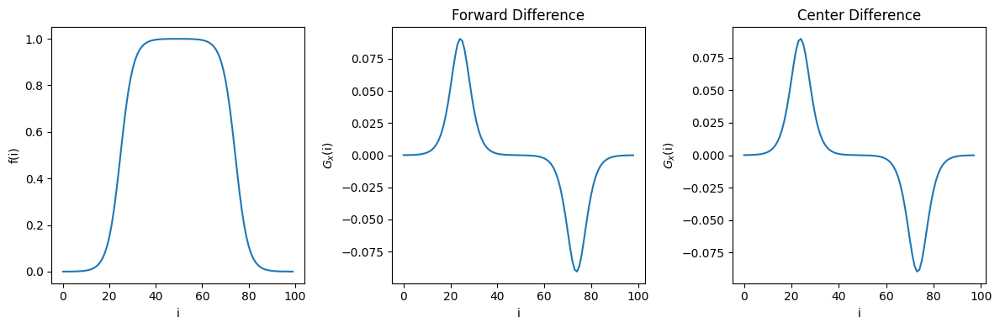

In [25]:
#@title
def plot_filter(filter, ax, fontsize = 15):
    if not filter.shape == (3, 3):
        raise Exception("Filter must me a 3x3 ndarray")

    for i in range(4):
        ax.plot([i, i], [0, 3], 'k-')
        ax.plot([0, 3], [i, i], 'k-')

    for i in range(3):
        for j in range(3):
            ax.text(i+0.5, j+0.5, "%s"%str(filter[j, i]), fontsize=fontsize, horizontalalignment = 'center', verticalalignment = 'center')

    ax.set_xlim((-0.1, 3.1)), ax.set_ylim((-0.1, 3.1))
    ax.spines['right'].set_visible(False), ax.spines['top'].set_visible(False), ax.spines['left'].set_visible(False), ax.spines['bottom'].set_visible(False)
    ax.set_xticks([]), ax.set_yticks([])
    ax.set_aspect('equal')

def example_func(x):
    return 1.0 / (1 + np.exp(-3 * (-np.abs(x) + 3)))

def plot_forward_center_difference():

    x = np.linspace(-6, 6, 100)
    f = example_func(x)
    f_fd = f[1::] - f[0:-1]
    f_cd = (f[2::] - f[0:-2]) / 2

    fig = pl.figure(figsize = (12, 4))

    ax1 = fig.add_subplot(131)
    ax1.plot(f)
    ax1.set_xlabel('i'), ax1.set_ylabel('f(i)')

    ax2 = fig.add_subplot(132)
    ax2.plot(f_fd)
    ax2.set_xlabel('i'), ax2.set_ylabel('$G_{x}$(i)')
    ax2.set_title('Forward Difference')

    ax3 = fig.add_subplot(133)
    ax3.plot(f_cd)
    ax3.set_xlabel('i'), ax3.set_ylabel('$G_{x}$(i)')
    ax3.set_title('Center Difference')

    pl.tight_layout()
    pl.show()

plot_forward_center_difference()

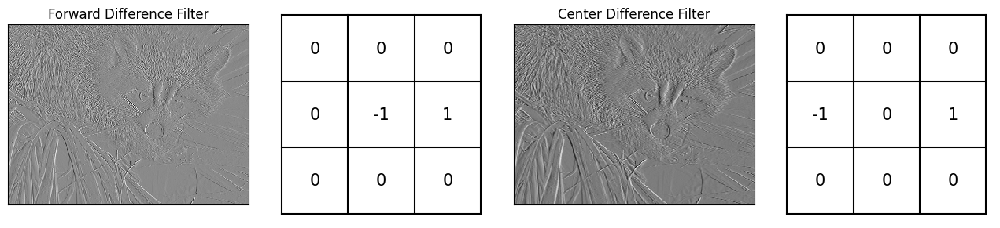

In [26]:
#@title
def show_forward_ceter_examples():

    fd_filter = np.array([[0, 0, 0], [0, -1, 1], [0, 0, 0]])
    cd_filter = np.array([[0, 0, 0], [-1, 0, 1], [0, 0, 0]])

    face_ds = face_R[0::3, 0::3]
    face_fd = convolve2d(face_ds, fd_filter, mode = 'same')
    face_cd = convolve2d(face_ds, cd_filter, mode = 'same')

    fig = pl.figure(figsize = (13, 3))

    ax1 = fig.add_subplot(141)
    ax1.imshow(face_fd, cmap = 'gray', interpolation = 'None')
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Forward Difference Filter")

    ax2 = fig.add_subplot(142)
    plot_filter(fd_filter, ax2)

    ax3 = fig.add_subplot(143)
    ax3.imshow(face_cd, cmap = 'gray', interpolation = 'None')
    ax3.set_xticks([]), ax3.set_yticks([])
    ax3.set_title("Center Difference Filter")

    ax4 = fig.add_subplot(144)
    plot_filter(cd_filter, ax4)

    pl.tight_layout()
    pl.show()

show_forward_ceter_examples()

These methods are a little noisy, but we can improve this by averaging over the orthogonal direction:

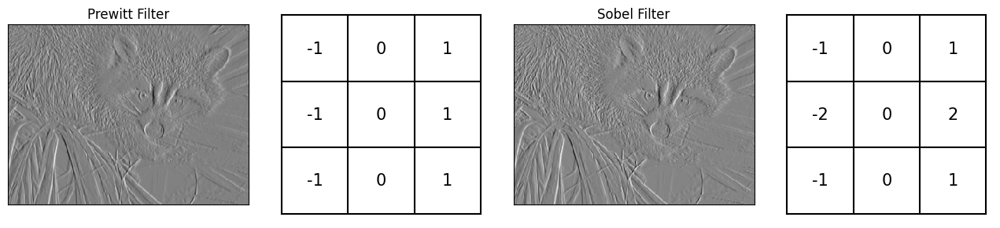

In [27]:
#@title
def show_forward_ceter_examples():

    prewitt_filter = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
    sobel_filter = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])

    face_ds = face_R[0::3, 0::3]
    face_prewitt = convolve2d(face_ds, prewitt_filter, mode = 'same')
    face_sobel = convolve2d(face_ds, sobel_filter, mode = 'same')

    fig = pl.figure(figsize = (13, 3))

    ax1 = fig.add_subplot(141)
    ax1.imshow(face_prewitt, cmap = 'gray', interpolation = 'None')
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Prewitt Filter")

    ax2 = fig.add_subplot(142)
    plot_filter(prewitt_filter, ax2)

    ax3 = fig.add_subplot(143)
    ax3.imshow(face_sobel, cmap = 'gray', interpolation = 'None')
    ax3.set_xticks([]), ax3.set_yticks([])
    ax3.set_title("Sobel Filter")

    ax4 = fig.add_subplot(144)
    plot_filter(sobel_filter, ax4)

    pl.tight_layout()
    pl.show()

show_forward_ceter_examples()


We can apply these filters in either direction (assuming we use the sobel definition from now on).

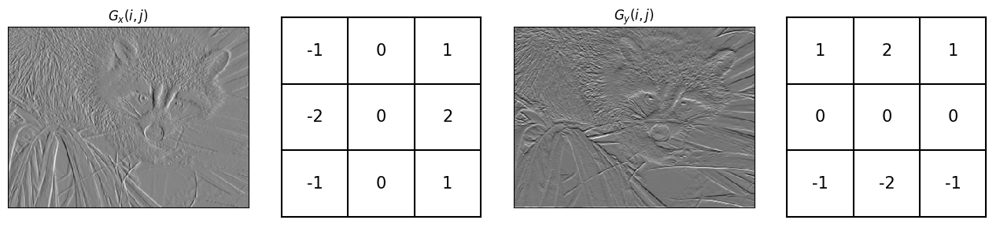

In [28]:
#@title
def show_sobel_examples():

    sobel_filter_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_filter_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

    face_ds = face_R[0::3, 0::3]
    face_sobel_x = convolve2d(face_ds, sobel_filter_x, mode = 'same')
    face_sobel_y = convolve2d(face_ds, sobel_filter_y, mode = 'same')

    fig = pl.figure(figsize = (13, 3))

    ax1 = fig.add_subplot(141)
    ax1.imshow(face_sobel_x, cmap = 'gray', interpolation = 'None')
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("$G_{x}(i, j)$")

    ax2 = fig.add_subplot(142)
    plot_filter(sobel_filter_x, ax2)

    ax3 = fig.add_subplot(143)
    ax3.imshow(face_sobel_y, cmap = 'gray', interpolation = 'None')
    ax3.set_xticks([]), ax3.set_yticks([])
    ax3.set_title("$G_{y}(i, j)$")

    ax4 = fig.add_subplot(144)
    plot_filter(sobel_filter_y, ax4)

    pl.tight_layout()
    pl.show()

show_sobel_examples()


These can be converted into the __magnitude__:
$$
  G(i, j) = \sqrt{G_{x}^{2} + G_{y}^{2}}
$$

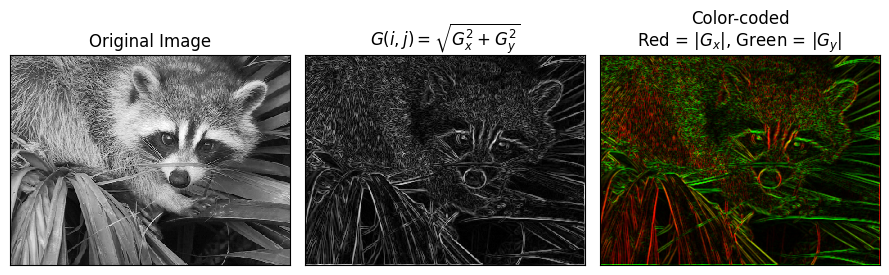

In [32]:
def show_magnitude_phase():

    sobel_filter_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_filter_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

    face_ds = face_R[0::3, 0::3]
    face_sobel_x = convolve2d(face_ds, sobel_filter_x, mode = 'same')
    face_sobel_y = convolve2d(face_ds, sobel_filter_y, mode = 'same')

    gradient = np.sqrt(face_sobel_x**2 + face_sobel_y**2)

    fig = pl.figure(figsize = (9, 3))

    ax1 = fig.add_subplot(131)
    ax1.imshow(face_R_ds, cmap = 'gray', interpolation = 'None')
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Original Image")

    ax2 = fig.add_subplot(132)
    ax2.imshow(gradient, cmap = 'gray', interpolation = 'None')
    ax2.set_xticks([]), ax2.set_yticks([])
    ax2.set_title(r"$G(i, j) = \sqrt{G_{x}^{2} + G_{y}^{2}}$")

    R = np.abs(face_sobel_x)
    G = np.abs(face_sobel_y)
    B = np.zeros(face_R_ds.shape)
    RGB = np.stack([R, G, B]).transpose((1, 2, 0))

    ax3 = fig.add_subplot(133)
    ax3.imshow(np.clip(RGB.astype('float')/(RGB.max() / 1.5), 0, 1))
    ax3.set_xticks([]), ax3.set_yticks([])
    ax3.set_title("Color-coded\nRed = |$G_{x}$|, Green = |$G_{y}$|")

    pl.tight_layout()
    pl.show()

show_magnitude_phase()


## Laplacian Filter

 - Similarly to the the gradient magnitude, we can define the laplacian of an image as: <br>
 $$
 \nabla^{2}f = \frac{\partial^{2}f}{\partial x^{2}} + \frac{\partial^{2}f}{\partial y^{2}}
 $$<br>
 - The laplacian has the advantage that it is __rotationally invariant__.<br>
 - As for the gradient operator, we can define the __laplacian kernel__, $L$, for digital images such that
 $$
     \nabla^{2}f \approx L \otimes f
 $$

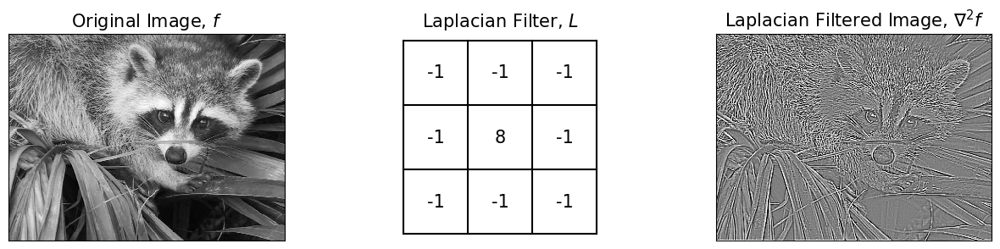

In [33]:
#@title
def show_laplacian():

    laplacian_filter = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])

    face_ds = face_R[0::3, 0::3]
    face_laplacian = convolve2d(face_ds, laplacian_filter, mode = 'same')

    fig = pl.figure(figsize = (13, 3))

    ax1 = fig.add_subplot(131)
    ax1.imshow(face_R_ds, cmap = 'gray', interpolation = 'None')
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Original Image, $f$", fontsize = 15)

    ax2 = fig.add_subplot(132)
    plot_filter(laplacian_filter, ax2)
    ax2.set_title("Laplacian Filter, $L$", fontsize = 15)

    ax3 = fig.add_subplot(133)
    ax3.imshow(face_laplacian, cmap = 'gray', clim = (-200, 200))
    ax3.set_xticks([]), ax3.set_yticks([])
    ax3.set_title("Laplacian Filtered Image, $\\nabla^{2}f$", fontsize = 15)

    pl.tight_layout()
    pl.show()

show_laplacian()

## Unsharp Masking

- We can also use the laplacian filter to highlight areas in the image with high-frequency components. <br><br>
- This is sometimes called <b>image sharpening</b><br><br>
- We generate a new image using the operation
\begin{align}
 g &= f + \lambda \nabla^{2}f \\
 &\approx f + \lambda L\otimes f\\
 & = (1 + \lambda L)\otimes f
\end{align}
 <img src='https://github.com/mdblackledge/theoryofimaging/blob/main/images/unsharp_kernel.jpg?raw=1' width = '80%'>

In [35]:
#@title

lambda_slider = FloatSlider(min=0, max=0.5, step=0.001, value=0, continuous_update=False, description = r'λ')

# decorate the plot function with an environment from the UIs:
@interact(l = lambda_slider)
def average_filter_demo(l):

    f = pl.figure(figsize = (5, 5))

    face_ds = face_R[0::4, 0::4]
    kernel = np.array([[-l, -l, -l], [-l, 1+8*l, -l], [-l, -l, -l]])
    filtered = convolve2d(face_ds, kernel, mode = 'same')

    ax1 = f.add_subplot(111)
    ax1.imshow(filtered, cmap = 'gray', clim = (0, 255))
    ax1.set_xticks([]), ax1.set_yticks([])

    pl.tight_layout()

    pl.show()

interactive(children=(FloatSlider(value=0.0, continuous_update=False, description='λ', max=0.5, step=0.001), O…

## Median Filters

- Kernels don't necessarily have to be convolved with the image.<br>
- We can use kernels to act as a window that we slide over every position in the image and perform some operation (other than a weighted summation).<br>
- For example, if we take the __meidan__ of the image values within the kernel, we end up with the __median filter__.<br>
- Again the effect of the filter increases with an incresing kernel size:

interactive(children=(IntSlider(value=1, continuous_update=False, description='kernel_size', max=11, min=1, st…

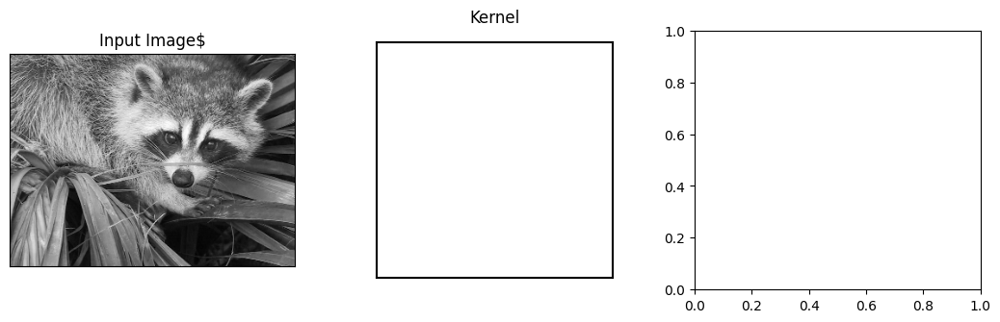

In [36]:
#@title
from skimage.filters import median

m_kernel_size_slider = IntSlider(min=1, max=11, step=2, value=1, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(kernel_size = m_kernel_size_slider)
def meidan_filter_demo(kernel_size):

    face_ds = face_R[0::3, 0::3]

    f = pl.figure(figsize = (13, 3.5))

    ax1 = f.add_subplot(131)
    ax1.imshow(face_R_ds, cmap = 'gray', clim = (0, 255))
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Input Image$")

    ax2 = f.add_subplot(132)
    for i in np.linspace(-1, 1, kernel_size+1):
        pl.plot([i, i], [-1, 1], 'k-')
        pl.plot([-1, 1], [i, i], 'k-')
    ax2.set_aspect('equal')
    pl.axis('off')
    ax2.set_title("Kernel")

    ax3 = f.add_subplot(133)
    im_filtered = median(face_ds, selem=np.ones((kernel_size, kernel_size)))

    ax3.imshow(im_filtered, cmap = 'gray', clim = (0, 255))
    ax3.set_xticks([]), ax3.set_yticks([])
    ax3.set_title("Median Filtered Image")

    pl.tight_layout()

    pl.show()

# __2.4 Transform Operators__

## Background

- Rather than working directly on image space, we can work with some other transformation space<br>
- The most common methods work in the frequency (Fourier) space of the image, and then an inverse Fourier Transform is used to recover the filtered image.<br>
- An example of this is the __low pass__ filters:

In [16]:
#@title

FWHM_slider = FloatSlider(min=1, max=400, step=1, value=400, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(FWHM = FWHM_slider)
def lowpass_filter_demo(FWHM):

    face_ds = face_R[0::3, 0::3]
    faceFFT = fft.fftshift(fft.fft2(face_ds))

    x = np.linspace(-face_ds.shape[1]/2, face_ds.shape[1]/2, face_ds.shape[1])
    y = np.linspace(-face_ds.shape[0]/2, face_ds.shape[0]/2, face_ds.shape[0])
    X, Y = np.meshgrid(x, y)

    var = (FWHM / 2.355)**2

    gaussian_mask = np.exp( - 0.5 * (X**2 + Y**2) / var)
    circular_mask = 1.0*(gaussian_mask > 0.5)

    circular_filtered_FFT = circular_mask * faceFFT
    circular_filtered_image = fft.ifft2(fft.fftshift(circular_filtered_FFT))
    gaussian_filtered_FFT = gaussian_mask * faceFFT
    gaussian_filtered_image = fft.ifft2(fft.fftshift(gaussian_filtered_FFT))

    f = pl.figure(figsize = (13, 3.5))

    ax1 = f.add_subplot(141)
    FFT_display = np.log(np.abs(circular_filtered_FFT))
    FFT_display[~np.isfinite(FFT_display)] = 0
    ax1.imshow(FFT_display, cmap = 'gray')
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Circular Filtered FT")

    ax2 = f.add_subplot(142)
    ax2.imshow(np.abs(circular_filtered_image), cmap = 'gray')
    ax2.set_xticks([]), ax2.set_yticks([])
    ax2.set_title("Circular Filtered Image")

    ax1 = f.add_subplot(143)
    FFT_display = np.log(np.abs(gaussian_filtered_FFT))
    FFT_display[~np.isfinite(FFT_display)] = FFT_display[np.isfinite(FFT_display)].min()
    ax1.imshow(FFT_display, cmap = 'gray', clim = (0, 16))
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Gaussian Filtered FT")

    ax2 = f.add_subplot(144)
    ax2.imshow(np.abs(gaussian_filtered_image), cmap = 'gray')
    ax2.set_xticks([]), ax2.set_yticks([])
    ax2.set_title("Gaussian Filtered Image")

    pl.tight_layout()

    pl.show()

interactive(children=(FloatSlider(value=400.0, continuous_update=False, description='FWHM', max=400.0, min=1.0…

- An alternative is to use a __high pass__ filter that only selectes the high frequency components:

In [ ]:
#@title
from skimage.filters import median

high_FWHM_slider = FloatSlider(min=1, max=50, step=0.01, value=1, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(FWHM = high_FWHM_slider)
def highpass_filter_demo(FWHM):

    face_ds = face_R[0::3, 0::3]
    faceFFT = fft.fftshift(fft.fft2(face_ds))

    x = np.linspace(-face_ds.shape[1]/2, face_ds.shape[1]/2, face_ds.shape[1])
    y = np.linspace(-face_ds.shape[0]/2, face_ds.shape[0]/2, face_ds.shape[0])
    X, Y = np.meshgrid(x, y)

    var = (FWHM / 2.355)**2

    gaussian_mask = 1.0 - np.exp( - 0.5 * (X**2 + Y**2) / var)
    circular_mask = 1.0*(gaussian_mask > 0.5)

    circular_filtered_FFT = circular_mask * faceFFT
    circular_filtered_image = fft.ifft2(fft.fftshift(circular_filtered_FFT))
    gaussian_filtered_FFT = gaussian_mask * faceFFT
    gaussian_filtered_image = fft.ifft2(fft.fftshift(gaussian_filtered_FFT))

    f = pl.figure(figsize = (15, 3.5))

    ax1 = f.add_subplot(141)
    FFT_display = np.log(np.abs(circular_filtered_FFT))
    FFT_display[~np.isfinite(FFT_display)] = 0
    ax1.imshow(FFT_display, cmap = 'gray')
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Circular Filtered FT")

    ax2 = f.add_subplot(142)
    ax2.imshow(np.abs(circular_filtered_image), cmap = 'gray')
    ax2.set_xticks([]), ax2.set_yticks([])
    ax2.set_title("Circular Filtered Image")

    ax1 = f.add_subplot(143)
    FFT_display = np.log(np.abs(gaussian_filtered_FFT))
    FFT_display[~np.isfinite(FFT_display)] = FFT_display[np.isfinite(FFT_display)].min()
    ax1.imshow(FFT_display, cmap = 'gray', clim = (0, 16))
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Gaussian Filtered FT")

    ax2 = f.add_subplot(144)
    ax2.imshow(np.abs(gaussian_filtered_image), cmap = 'gray')
    ax2.set_xticks([]), ax2.set_yticks([])
    ax2.set_title("Gaussian Filtered Image")

    pl.tight_layout()

    pl.show()

interactive(children=(FloatSlider(value=1.0, continuous_update=False, description='FWHM', max=50.0, min=1.0, s…

- Or we may choose a __band pass__ filter:

In [ ]:
#@title

from skimage.filters import median

FWHM_slider_1 = FloatSlider(min=1, max=50, step=0.01, value=1, continuous_update=False)
FWHM_slider_2 = FloatSlider(min=50, max=400, step=1, value=400, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(FWHM1 = FWHM_slider_1, FWHM2 = FWHM_slider_2)
def highpass_filter_demo(FWHM1, FWHM2):

    face_ds = face_R[0::3, 0::3]
    faceFFT = fft.fftshift(fft.fft2(face_ds))

    x = np.linspace(-face_ds.shape[1]/2, face_ds.shape[1]/2, face_ds.shape[1])
    y = np.linspace(-face_ds.shape[0]/2, face_ds.shape[0]/2, face_ds.shape[0])
    X, Y = np.meshgrid(x, y)

    var1 = (FWHM1 / 2.355)**2
    var2 = (FWHM2 / 2.355)**2

    gaussian_mask = (1.0 - np.exp(-0.5 * (X**2 + Y**2) / var1)) * np.exp(-0.5 * (X**2 + Y**2) / var2)
    gaussian_mask = gaussian_mask / gaussian_mask.max()
    circular_mask = 1.0*(gaussian_mask > 0.5)

    circular_filtered_FFT = circular_mask * faceFFT
    circular_filtered_image = fft.ifft2(fft.fftshift(circular_filtered_FFT))
    gaussian_filtered_FFT = gaussian_mask * faceFFT
    gaussian_filtered_image = fft.ifft2(fft.fftshift(gaussian_filtered_FFT))

    f = pl.figure(figsize = (7.5, 3.0))

    ax1 = f.add_subplot(121)
    FFT_display = np.log(np.abs(circular_filtered_FFT))
    FFT_display[~np.isfinite(FFT_display)] = 0
    ax1.imshow(FFT_display, cmap = 'gray')
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Band-Pass Filtered FT")

    ax2 = f.add_subplot(122)
    ax2.imshow(np.abs(circular_filtered_image), cmap = 'gray')
    ax2.set_xticks([]), ax2.set_yticks([])
    ax2.set_title("Band-Pass Filtered Image")

    pl.tight_layout()

    pl.show()

interactive(children=(FloatSlider(value=1.0, continuous_update=False, description='FWHM1', max=50.0, min=1.0, …

- Ultimately, these filters take the form:<br>
\begin{align}
     g &= \text{FT}^{-1}\{G\} \\
       &= \text{FT}^{-1}\{A\cdot F\},\quad\quad\quad\quad\ \text{(A is the filter and F is the FT of the iinput image)} \\
       &= \text{FT}^{-1}\{A\} \circledast \text{FT}^{-1}\{F\}, \quad \text{(convlution theorem)}\\
       &= a \circledast f
\end{align}<br>
- This shows that, at least in principle, transfrom operators are _equivalent_ to convolution of the image, $f$, with some appropriate kernel, $a$, as we explored in the preceeding section. <br>
- Many transform operators can serve a surrogates for spatial operators and vice versa.

# __2.5 Noise Distributions__

- No image is perfect.<br>
- Images cannot perfectly replicate the object, they just capture enough information to provide a reasonable representation of it.<br>
- We have already seen how the point-spread function (PSF) of an imaging system captures the information required to describe the <i>geometric</i> inaccuracies of the image.<br>
- However, another major factor that degardes image quality is <b>noise</b>.<br>
- All images are affected by noise so some degree, and the type of noise will depend on the imaging system being used.

<img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_3/images/noise_examples.jpg?raw=true" width=400>


## Mathematics of noise

- So how do we characterise imaging noise?<br>
- The histogram of pixel intensity values within a homogeoneous looking region within the liver on CT demonstrates there is spread in the values.<br>
- By calculating the mean, $\mu$, and standard deviation, $\sigma$, of the pixel values we obtain a fit of the data to a <b>Gaussian Distribution</b>:<br>
$$
    \# \propto \frac{1}{\sigma\sqrt{2\pi}}\exp\left( -\frac{(HU - \mu)^{2}}{2\sigma^{2}} \right)\qquad\left( = \mathscr{N}(HU, \sigma) \right)
$$
- This represents a key hypothesis that is assumed in most imaging applications: Noise can be characterised by a <b>probability distribution</b>.

<img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_3/images/CT_roi.jpg?raw=true" width=200>
<img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_3/images/CT_histogram.jpg?raw=true" width=400>


## Gaussian Noise

- Gaussian noise is a good assumption in many imaging applications.<br>
- In many systems it can result from thermal fluctuations in the current within electrical circuits that add to the final image signal ('Johnson noise').<br>
- Gaussian noise is <b>additive</b> to a noise-free image, $f$:<br>
\begin{align}
     g(i, j) = f(i, j) + \varepsilon(i, j)
\end{align}<br><br>
where $\varepsilon \sim \mathscr{N}(0, \sigma)$ is random noise sampled from a Gaussian ditribution.

In [ ]:
#@title
std_slider = FloatSlider(min=1, max=75, step=1, value=1, continuous_update=False, description = r'\(\sigma\)')

# decorate the plot function with an environment from the UIs:
@interact(std = std_slider)
def gaussian_example(std):

    face_ds = face_R[0::3, 0::3]
    noise = np.random.randn(*face_ds.shape)*std
    face_noisy = face_ds + noise
    x = np.linspace(-150, 150, 100)
    p = 1.0/np.sqrt(2*np.pi*std**2) * np.exp(-0.5 * x**2 / std**2)

    f = pl.figure(figsize = (16, 3.5))

    ax1 = f.add_subplot(141)
    ax1.imshow(face_ds, cmap = 'gray', clim = (0, 255))
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("$f(i, j)$")

    ax2 = f.add_subplot(142)
    ax2.imshow(noise, cmap = 'gray', clim = (-255, 255))
    ax2.set_xticks([]), ax2.set_yticks([])
    ax2.set_title("$\epsilon(i, j)$")

    ax3 = f.add_subplot(143)
    ax3.imshow(face_noisy, cmap = 'gray', clim = (0, 255))
    ax3.set_xticks([]), ax3.set_yticks([])
    ax3.set_title("$g(i, j) = f(i, j) + \epsilon(i, j)$")

    ax4 = f.add_subplot(144)
    ax4.plot(x, p, 'k-', lw = 2)
    ax4.set_ylim((0, 0.10))
    ax4.set_xlabel("$\epsilon$", fontsize = 13), ax4.set_ylabel("$p(\epsilon)$", fontsize = 13)
    ax4.text(150, 0.09, "$\sigma$ = %d"%std, verticalalignment = "top", horizontalalignment = "right")
    ax4.set_title("$p(\epsilon) = \mathcal{N}(0, \sigma)$")

    pl.tight_layout()
    pl.show()

interactive(children=(FloatSlider(value=1.0, continuous_update=False, description='\\(\\sigma\\)', max=75.0, m…

In [ ]:
#@title
from skimage import io
if not os.path.exists("CT_full.jpg"):
    os.system("wget -O CT_full.jpg https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_3/images/CT_full.jpg?raw=true")
CT_im = io.imread('CT_full.jpg')[:, :, 0]

kernel_size_slider_CT = IntSlider(min=1, max=15, step=2, value=1, continuous_update=False)
d_slider_CT = FloatSlider(min=0.01, max=4, step=0.01, value=1, continuous_update=False, description = r'\(\beta\)')

# decorate the plot function with an environment from the UIs:
@interact(kernel_size = kernel_size_slider_CT, d = d_slider_CT)
def weighted_average_CT_demo(kernel_size, d):

    f = pl.figure(figsize = (16, 7))

    kernel = np.zeros((kernel_size, kernel_size))
    for i in range(kernel_size):
        for j in range(kernel_size):
            kernel[i, j] = 1.0 / (d + np.sqrt((i - kernel_size / 2)**2 + (j - kernel_size / 2)**2))

    CT_ds = CT_im[0::4, 0::4]
    kernel = kernel / kernel.sum ()
    CT_filtered = convolve2d(CT_ds, kernel, mode='same',  boundary = "fill", fillvalue = 0)

    ax1 = f.add_subplot(121)
    ax1.imshow(CT_ds, cmap = 'gray', clim = (0, 255))
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Original Image")

    ax2 = f.add_subplot(122)
    ax2.imshow(CT_filtered, cmap = 'gray', clim = (0, 255))
    ax2.set_xticks([]), ax2.set_yticks([])
    ax2.set_title("Filtered Image")

    pl.show()

interactive(children=(IntSlider(value=1, continuous_update=False, description='kernel_size', max=15, min=1, st…

## Poisson Noise

 - Also refered to as __shot noise__, describes the noise associated with counting processes (e.g. photon counting in CCD cameras, PET imaging)<br>
 - Can no longer assume that noise is additive, as the amount of noise added to each pixel location depends on the pixel value itself.<br>
 - The probability of detecting $g$ counts, given that the true number should be $f$ is:<br><br>
 $$
 p(g|f) = e^{-f}\cdot\frac{f^{g}}{g!}
 $$

In [39]:
#@title
#@ title
from scipy.special import loggamma
from scipy.stats import poisson

kernel_size_slider_CT = IntSlider(min=1, max=15, step=2, value=1, continuous_update=False)
d_slider_CT = FloatSlider(min=0.01, max=0.4, step=0.01, value=1, continuous_update=False, description = r'beta')
im_max_slider = FloatSlider(min=4, max=100, step=1, value=255, continuous_update=False, description = r'f Maximum')

# decorate the plot function with an environment from the UIs:
@interact(im_max = im_max_slider, d = d_slider_CT)
def show_poisson(im_max):

    face_ds = (face_R[0::3, 0::3] * im_max / 255).astype('int')
    face_noise = np.random.poisson(face_ds)
    noise = face_noise - face_ds

    fig = pl.figure(figsize = (17, 3.5))

    ax1 = fig.add_subplot(141)
    ax1.imshow(face_ds, cmap = 'gray', clim = (0, np.percentile(face_ds, 90)))
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("True Counts, $f$")

    ax2 = fig.add_subplot(142)
    ax2.imshow(face_noise, cmap = 'gray', clim = (0, np.percentile(face_noise, 90)))
    ax2.set_xticks([]), ax2.set_yticks([])
    ax2.set_title("Measured Counts, $g$")

    ax3 = fig.add_subplot(143)
    ax3.imshow(noise, cmap = 'gray')
    ax3.set_xticks([]), ax3.set_yticks([])
    ax3.set_title("Noise Field ($g - f$)")

    g = np.arange(1, int(2*im_max))
    ax4 = fig.add_subplot(144)
    p_max = 0
    for g_ in g:
        p = poisson.pmf(g_, mu = im_max)
        ax4.plot([g_, g_], [0, p], "b-")
        ax4.plot([g_], [p], "bo")
        if p > p_max:
            p_max = p

    ax4.set_xlim(1, g.max()), ax4.set_ylim((0, 1.1*p_max))
    ax4.set_title(r"$p(g|f) = e^{-%d}\cdot %d^{g} / g!$"%(im_max, im_max))
    ax4.set_xlabel(r"$g$")
    ax4.set_ylabel(r"$p(g|f)$")

    pl.tight_layout()
    pl.show()

interactive(children=(FloatSlider(value=100.0, continuous_update=False, description='f Maximum', min=4.0, step…

## Salt and Pepper Noise

 - This type of noise typically characterises individual pixels that are faulty within a sensor, ot have perhaps been saturated by some radiation source (e.g. high energy x-rays detected by a light sensor).<br><br>
 - Additive noise can be modelled using zero-centered 'heavy-tail' probability distributions (have an undefined mean, standard deviation etc.)<br><br>
 - As an example, we can use the Cauchy distribution, which has the form:<br><br>
 $$
 p(\varepsilon|\gamma) = \frac{1}{\pi\gamma\left(1+\left[\frac{\varepsilon}{\gamma}\right]^{2}\right)}
 $$

In [41]:
#@title
gamma_slider = FloatSlider(min=0.01, max=100, step=0.01, value=1, continuous_update=False, description = r'	γ')

# decorate the plot function with an environment from the UIs:
@interact(gamma = gamma_slider)
def salt_pepper_example(gamma):

    face_ds = face_R[0::3, 0::3]
    noise = np.random.standard_cauchy(face_ds.shape) * gamma
    face_noise = face_ds + noise

    fig = pl.figure(figsize = (17, 3.5))

    ax1 = fig.add_subplot(141)
    ax1.imshow(face_ds, cmap = 'gray')
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title(r"True Image, $f$")

    ax2 = fig.add_subplot(142)
    ax2.imshow(face_noise, cmap = 'gray', clim = (0, 255))
    ax2.set_xticks([]), ax2.set_yticks([])
    ax2.set_title(r"Noisy Image, $g$")

    ax3 = fig.add_subplot(143)
    ax3.imshow(noise, cmap = 'gray', clim = (0, 255))
    ax3.set_xticks([]), ax3.set_yticks([])
    ax3.set_title(r"Noise Field ($g - f$)")

    ax4 = fig.add_subplot(144)
    e = np.linspace(-255, 255, 1000)
    p = 1.0 / (gamma * np.pi * (1 + (e/gamma)**2))
    ax4.plot(e, p, 'k-')
    ax4.set_xlabel(r"$\epsilon$")
    ax4.set_ylabel(r"$p(\epsilon)$")

    pl.tight_layout()
    pl.show()

interactive(children=(FloatSlider(value=1.0, continuous_update=False, description='\tγ', min=0.01, step=0.01),…

# __2.6 Noise Filtering__



 - So can we smooth out this noise?<br>
 - Smoothing with a weighted-kernel (from earlier):<br>

In [43]:
#@title
from skimage import io
CT_im = face_R

kernel_size_slider_CT_sp = IntSlider(min=1, max=15, step=2, value=1, continuous_update=False)
d_slider_CT_sp = FloatSlider(min=0.01, max=0.4, step=0.01, value=1, continuous_update=False, description = r'β')

# decorate the plot function with an environment from the UIs:
@interact(kernel_size = kernel_size_slider_CT_sp, d = d_slider_CT_sp)
def weighted_average_CT_sp_demo(kernel_size, d):

    f = pl.figure(figsize = (16, 7))

    kernel = np.zeros((kernel_size, kernel_size))
    for i in range(kernel_size):
        for j in range(kernel_size):
            kernel[i, j] = 1.0 / (d + np.sqrt((i - kernel_size / 2)**2 + (j - kernel_size / 2)**2))

    CT_ds = CT_im[0::4, 0::4]
    CT_ds = CT_ds * 255.0 / CT_ds.max()
    noise = np.random.standard_cauchy(CT_ds.shape) * 3
    CT_ds = CT_ds + noise

    kernel = kernel / kernel.sum ()
    CT_filtered = convolve2d(CT_ds, kernel, mode='same',  boundary = "fill", fillvalue = 0)

    ax1 = f.add_subplot(121)
    ax1.imshow(CT_ds, cmap = 'gray', clim = (0, 255))
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Noisy Image")

    ax2 = f.add_subplot(122)
    ax2.imshow(CT_filtered, cmap = 'gray', clim = (0, 255))
    ax2.set_xticks([]), ax2.set_yticks([])
    ax2.set_title("Filtered Image")

    pl.show()

interactive(children=(IntSlider(value=1, continuous_update=False, description='kernel_size', max=15, min=1, st…

- Normal smoothing filters don't work as heavy-tail distributions don't have a mean!<br><br>
- There is one more filter we can try:<br>

In [44]:
#@title
from skimage import io
from skimage.filters import median

kernel_size_slider_CT_median = IntSlider(min=1, max=15, step=2, value=1, continuous_update=False)

# decorate the plot function with an environment from the UIs:
@interact(kernel_size = kernel_size_slider_CT_median)
def weighted_average_CT_median_demo(kernel_size):

    f = pl.figure(figsize = (16, 7))

    CT_ds = CT_im[0::4, 0::4]
    CT_ds = CT_ds * 255.0 / CT_ds.max()
    noise = np.random.standard_cauchy(CT_ds.shape) * 3
    CT_ds = np.clip(CT_ds + noise, 0, 255).astype('int')

    CT_filtered = median(CT_ds.astype('int'), selem = np.ones((kernel_size, kernel_size)))

    ax1 = f.add_subplot(121)
    ax1.imshow(CT_ds, cmap = 'gray', clim = (0, 255))
    ax1.set_xticks([]), ax1.set_yticks([])
    ax1.set_title("Noisy Image")

    ax2 = f.add_subplot(122)
    ax2.imshow(CT_filtered, cmap = 'gray', clim = (0, 255))
    ax2.set_xticks([]), ax2.set_yticks([])
    ax2.set_title("Median Filtered Image")

    pl.show()

interactive(children=(IntSlider(value=1, continuous_update=False, description='kernel_size', max=15, min=1, st…

<Figure size 1600x700 with 0 Axes>

# __2.7 Practical Considerations__

- In most imaging systems it is impractical / impossible to accurately identify the noise distribution.<br>
- In reality noise will occur from a variety of sources with different distributions; for example in ultrasound we have electrical Gaussian noise within the detector elements <b>and</b> speckle originating within the patient. <br>
- In many applications it is sufficient to assume the noise is <b>Gaussian</b> and <b>additive</b>.<br>
- We can look at the distribution of noise by drawing a region within 'uniform' part of the image, and measure the <b>standard deviation</b> of the contained pixel values as a measure of the spread of the noise distribution.<br>
- Uniform test-objects (phantoms) can also be used to ensure that we do not measure biological variation.

<img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_3/images/CT_roi.jpg?raw=true" width=200>
<img src="https://github.com/mdblackledge/theoryofimaging/blob/main/Lecture_3/images/CT_histogram.jpg?raw=true" width=400>

- There are a number of useful indices we can quote to give some idea about the noise perfomance of our imaging system.<br><br>
 - The __signal-to-noise ratio__ (SNR) identifies the relative amplitude of the signal we are trying to measure, $S$, to the magnitude of noise in the image:
 $$
 \text{SNR} = \frac{S}{\sigma_{\varepsilon}}
 $$
 - The __contrast-to-noise ratio__ (CNR) on the other hand measures the ability of an imaging system to discriminate between two objects (with signals $S_{1}$ and $S_{2}$) in the presence of noise:
 $$
 \text{CNR} = \frac{|S_{2} - S_{1}|}{\sigma_{\varepsilon}}
 $$

In [ ]:
#@title
contrast_slider_CNR = FloatSlider(min=0, max=1, step=0.01, value=0, continuous_update=False)
SNR_slider_CNR = FloatSlider(min=0.5, max=10, step=0.01, value=5, continuous_update=False, description = "SNR")

# decorate the plot function with an environment from the UIs:
@interact(snr = SNR_slider_CNR, contrast = contrast_slider_CNR)
def contrast_example_CNR(snr, contrast):

    S_1 = (1.0 + contrast) / 2 * np.ones((100, 50))
    S_2 = (1.0 - contrast) / 2 * np.ones((100, 50))
    S = np.hstack([S_1, S_2])

    sigma = (1.0 + contrast) / (2 * snr)
    CNR = np.abs(contrast) / sigma
    SNR_2 = ((1.0 - contrast) / 2) / sigma

    noise = np.random.randn(*S.shape) * sigma
    S = S + noise

    f = pl.figure(figsize = (5, 5))

    ax1 = f.add_subplot(111)
    ax1.imshow(S, cmap = 'gray', origin = 'lower', clim = (-2, 2))
    ax1.set_xticks([]), ax1.set_yticks([])
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.9)
    ax1.text(95, 95, "SNR = %.2f\nCNR = %.2f"%(SNR_2, CNR), verticalalignment = 'top', horizontalalignment = 'right', bbox = props)
    ax1.text(5, 95, "SNR = %.2f"%snr, verticalalignment = 'top', horizontalalignment = 'left', bbox = props)

    pl.show()

interactive(children=(FloatSlider(value=5.0, continuous_update=False, description='SNR', max=10.0, min=0.5, st…